<center>
    <h1>Fruit Inspection - Second Task: Russet Detection</h1>
    <h2>Image Processing and Computer Vision</h2>
    <h3>Facundo Nicolas Maidana and Riccardo Spolaor</h3>
    <h4>facundo.maidana@studio.unibo.it; riccardo.spolaor@studio.unibo.it</h4>
</center>

---

This notebook presents the development of a system aimed at locating defects and imperfection in fruits. Each fruit is acquired through a NIR *(Near Infra-Red)* and color camera that present little parallax effect among each other.

<table>
    <tr>
        <td><img src="images/second task/C0_000004.png" width="200"/></td>
        <td><img src="images/second task/C1_000004.png" width="200"/></td>
    </tr>
    <tr>
        <td style='text-align:left'>NIR example</td>
        <td style='text-align:left'>Color example</td>
    </tr>
</table>

# 00 Prerequisites
The libraries necessary for the task are imported.

In [1]:
#!pip install sciki

In [2]:
%matplotlib inline

import cv2
import math
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import scipy as sc
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.image import extract_patches_2d
from time import process_time, time

# Utils libraries
from graphics import *
from utils import *

The cell below illustrates the version of `OpenCV` used for the task.

In [3]:
print(f'Using OpenCV version: {cv2.__version__}.')

Using OpenCV version: 4.6.0.


The random seed is set for both the `numpy` and `OpenCV` libraries in order to guarantee reproducibility of results.

In [4]:
SEED = 42

cv2.setRNGSeed(SEED)
np.random.seed(SEED)

# 01 Image analysis 
The series of images is firstly imported and plotted.

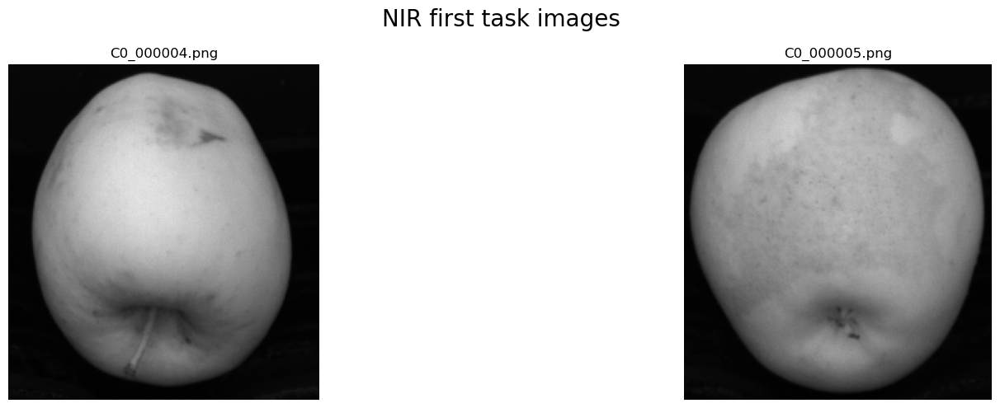

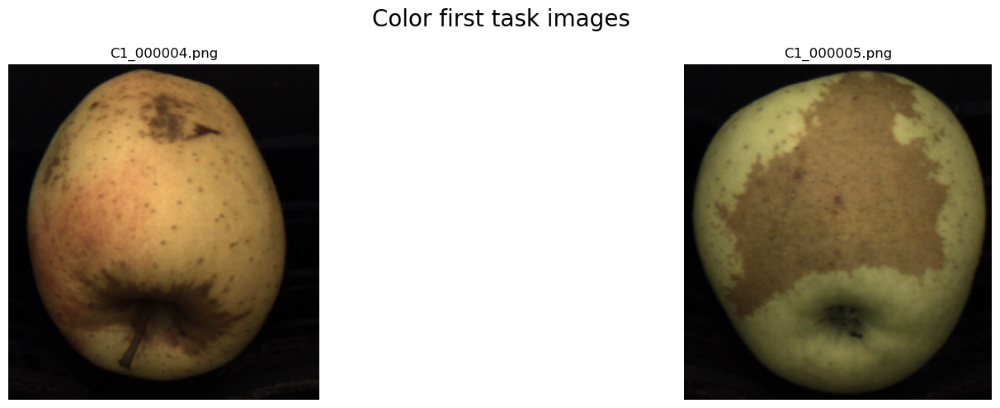

In [5]:
# Create two arrays containing the names of the NIR and color images respectively
nir_names, colour_names = [[f'C{j}_00000{i}.png' for i in [4, 5]] for j in [0,1]]

# Directory where the images are saved
DIR = 'images/second task/'

# Import NIR and colour images
nir_imgs = [cv2.imread(f'{DIR}{img}', cv2.IMREAD_GRAYSCALE) for img in nir_names]
colour_imgs = [cv2.imread(f'{DIR}{img}') for img in colour_names]

# Plot the NIR and color images
plot_image_grid(nir_imgs, 'NIR first task images', nir_names)
plot_image_grid(colour_imgs, 'Color first task images', colour_names)

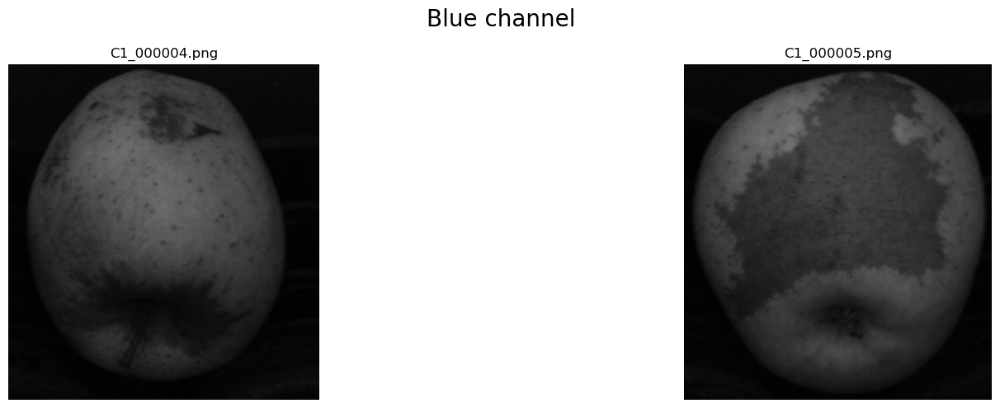

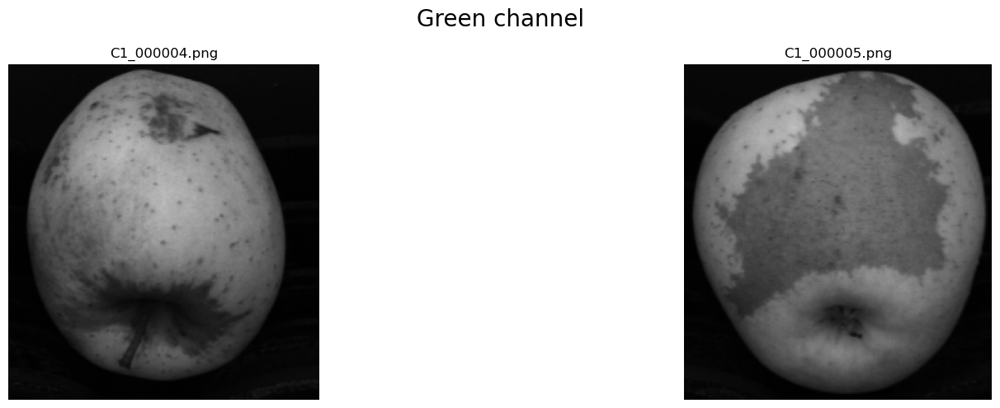

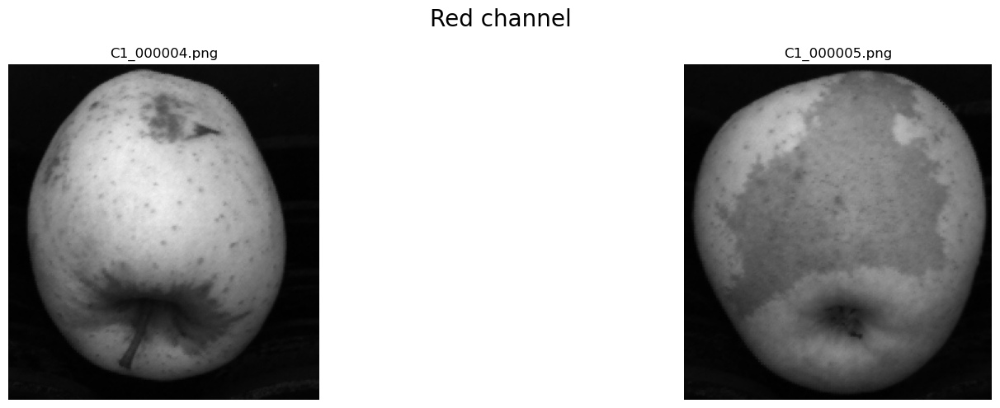

In [6]:
colour_B = []; colour_G = []; colour_R = []

for img in colour_imgs:
    B, G, R = cv2.split(img)
    colour_B.append(B)
    colour_G.append(G)
    colour_R.append(R)

# Plot the Channels of the images
plot_image_grid(colour_B, 'Blue channel', colour_names)
plot_image_grid(colour_G, 'Green channel', colour_names)
plot_image_grid(colour_R, 'Red channel', colour_names)

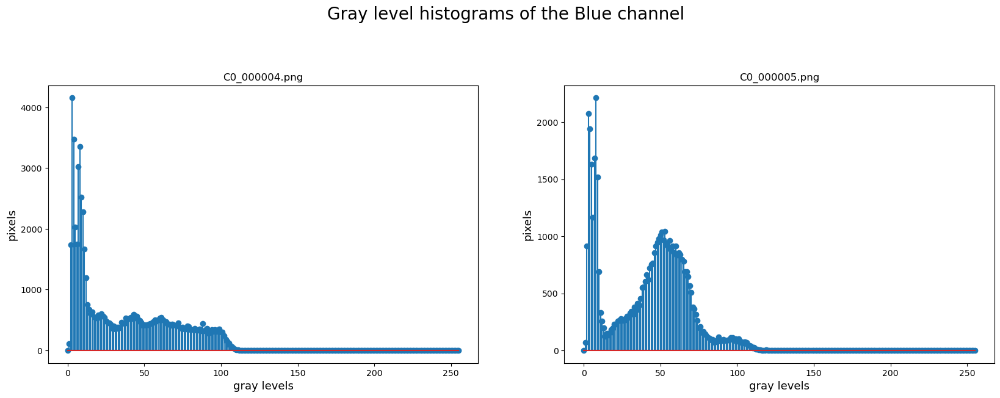

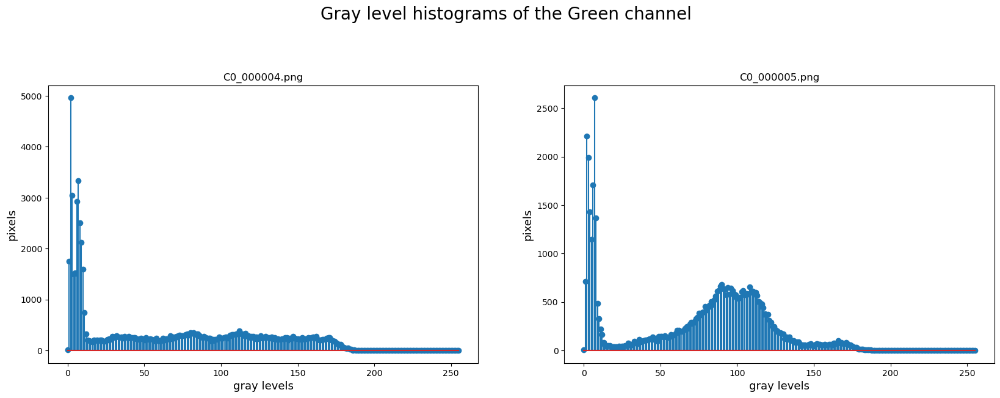

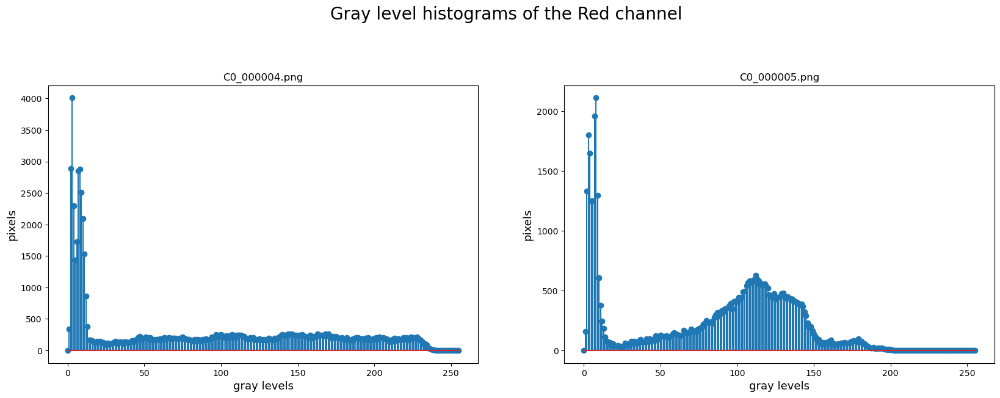

In [7]:
plot_histogram_grid(colour_B, 'Gray level histograms of the Blue channel', nir_names)
plot_histogram_grid(colour_G, 'Gray level histograms of the Green channel', nir_names)
plot_histogram_grid(colour_R, 'Gray level histograms of the Red channel', nir_names)

## todo 
- pack function to get mask in a utils package
- improve graphical representation (grid)

0.0


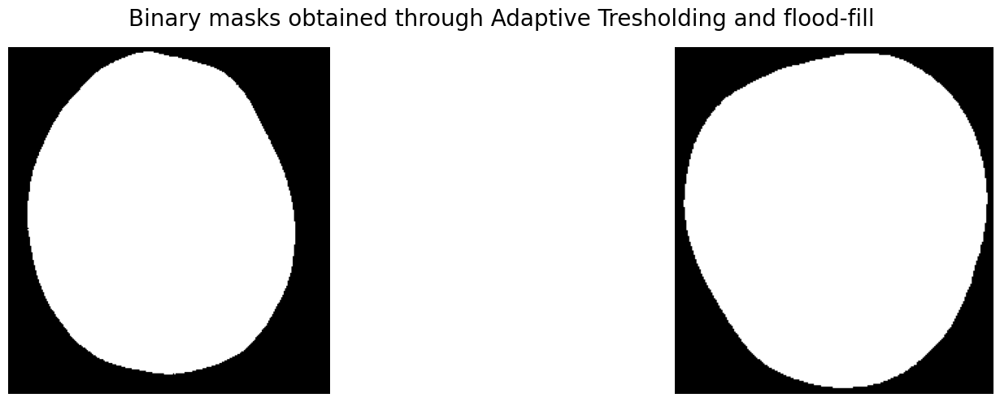

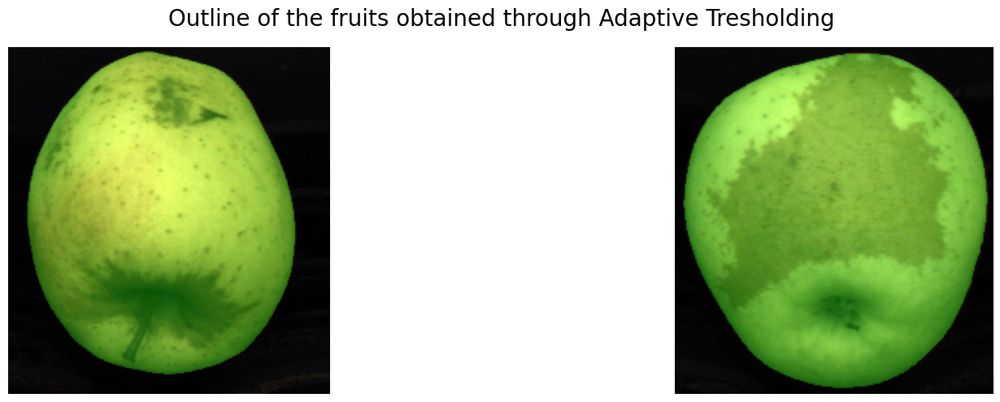

In [8]:
# obtaining the mask and preprocessing imgs

# median blur on images
filtered_colour_images = [cv2.medianBlur(img,5) for img in colour_imgs]

# greyscale image masking 

masks = []

s = process_time()
for img in filtered_colour_images:
    mask = cv2.adaptiveThreshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 5)
    masks.append(mask)

# plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding')
    
# Pad masks and flood-fill the background
masks = [np.pad(m, 1, mode='constant', constant_values=255) for m in masks]
for m in masks:
    cv2.floodFill(m, None, (0,0), 0)
# Downsample the masks to their original size
masks = [m[1:-1,1:-1] for m in masks]
print(process_time() - s)

# plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding')

masks = [apply_flood_fill(i) for i in masks]

plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding and flood-fill')

bounded_images = []

for idx, img in enumerate(colour_imgs):
    green_mask = cv2.cvtColor(masks[idx], cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    bounded_images.append(cv2.addWeighted(green_mask, 0.3, img, 1, 0))
    
plot_image_grid(bounded_images, 'Outline of the fruits obtained through Adaptive Tresholding')

In [9]:
# mask is applied to images
masked_filtered_imgs = [filtered_colour_images[i] & cv2.cvtColor(masks[i], cv2.COLOR_GRAY2BGR) for i in range(len(masks))]

In [10]:
def get_masked_color_space(img, mask, color_space):
    return cv2.cvtColor(img, color_space) #& cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR)

In [11]:
"""# Create HSV, HLS, LUV images
colour_space_dict = {
    'BGR': masked_filtered_imgs,
    'HSV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HSV_FULL) for i, img in enumerate(filtered_colour_images)],
    'HLS': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HLS_FULL) for i, img in enumerate(filtered_colour_images)],
    'LUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2Luv) for i, img in enumerate(filtered_colour_images)],
    'LAB': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2LAB) for i, img in enumerate(filtered_colour_images)],
    'YCrCb': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YCrCb) for i, img in enumerate(filtered_colour_images)],
    'YUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YUV) for i, img in enumerate(filtered_colour_images)]
}"""

"# Create HSV, HLS, LUV images\ncolour_space_dict = {\n    'BGR': masked_filtered_imgs,\n    'HSV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HSV_FULL) for i, img in enumerate(filtered_colour_images)],\n    'HLS': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HLS_FULL) for i, img in enumerate(filtered_colour_images)],\n    'LUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2Luv) for i, img in enumerate(filtered_colour_images)],\n    'LAB': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2LAB) for i, img in enumerate(filtered_colour_images)],\n    'YCrCb': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YCrCb) for i, img in enumerate(filtered_colour_images)],\n    'YUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YUV) for i, img in enumerate(filtered_colour_images)]\n}"

In [12]:
# Create HSV, HLS, LUV images
colour_space_dict = {
    'BGR': masked_filtered_imgs,
    'HSV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HSV_FULL) for i, img in enumerate(masked_filtered_imgs)],
    'HLS': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2HLS_FULL) for i, img in enumerate(masked_filtered_imgs)],
    'LUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2Luv) for i, img in enumerate(masked_filtered_imgs)],
    'LAB': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2LAB) for i, img in enumerate(masked_filtered_imgs)],
    'YCrCb': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YCrCb) for i, img in enumerate(masked_filtered_imgs)],
    'YUV': [get_masked_color_space(img, masks[i], cv2.COLOR_BGR2YUV) for i, img in enumerate(masked_filtered_imgs)]
}

In [13]:
def show_split_channels(imgs, colour_space_name, imgs_names=None):
    for i, img in enumerate(imgs):
        plot_image_grid(cv2.split(img), f'{colour_space_name} Channel division for image {colour_names[i]}', imgs_names)

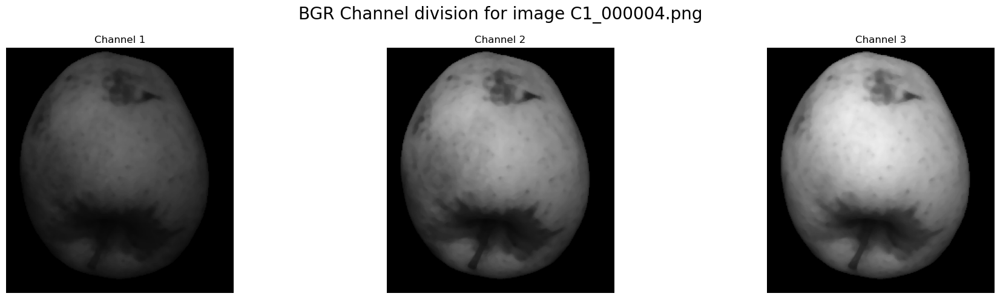

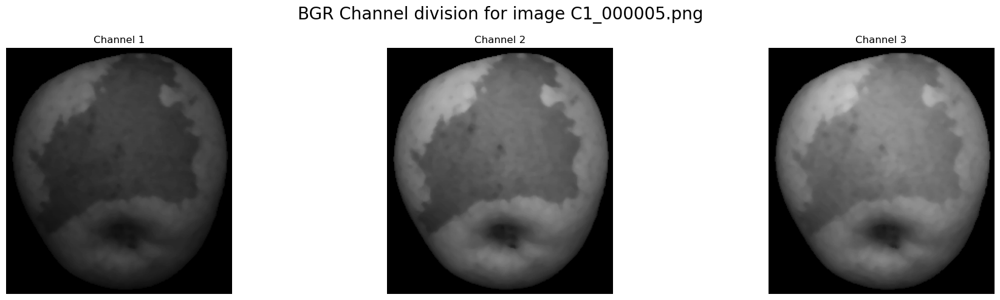

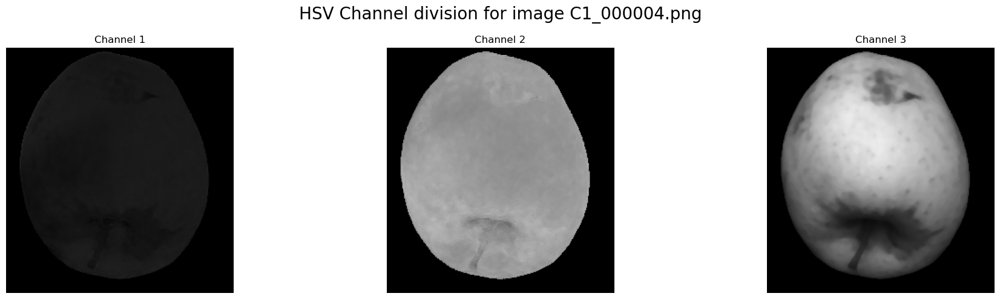

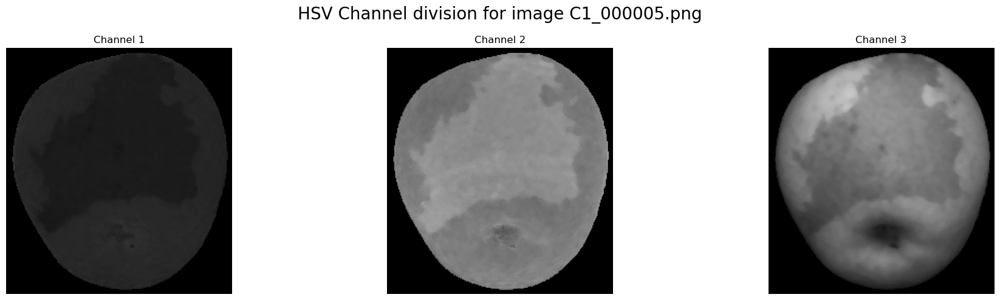

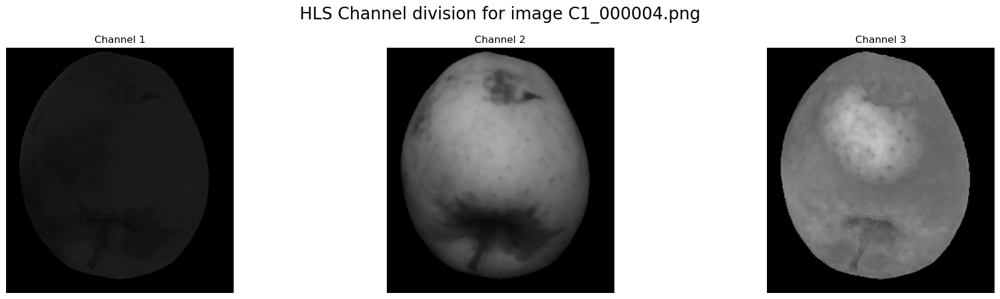

...

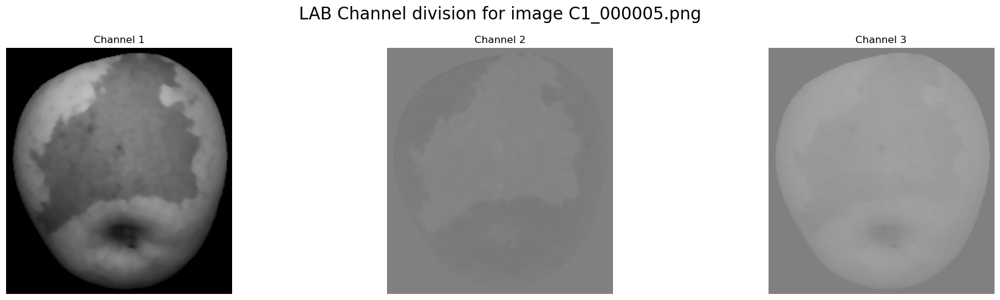

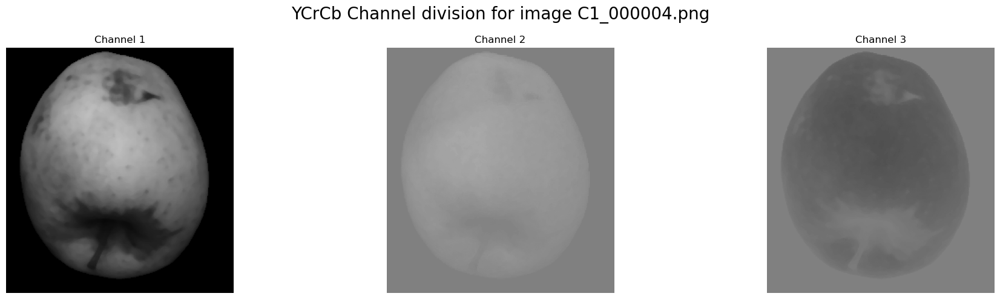

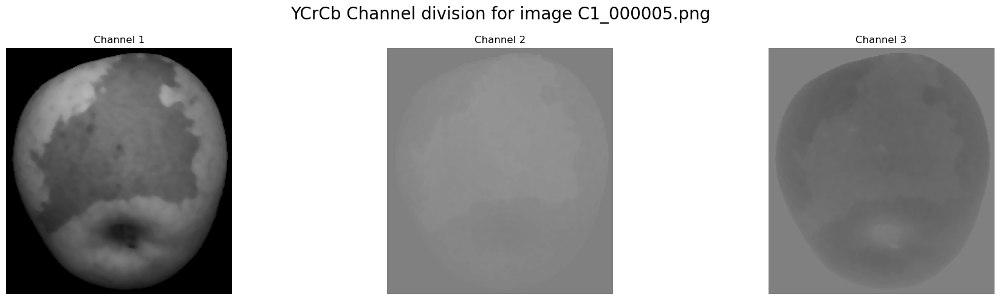

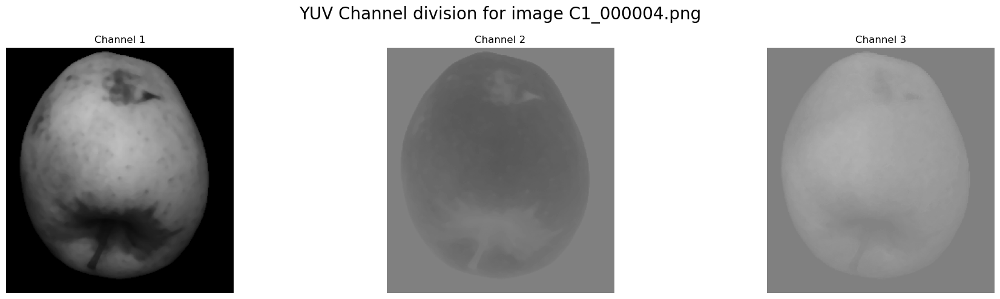

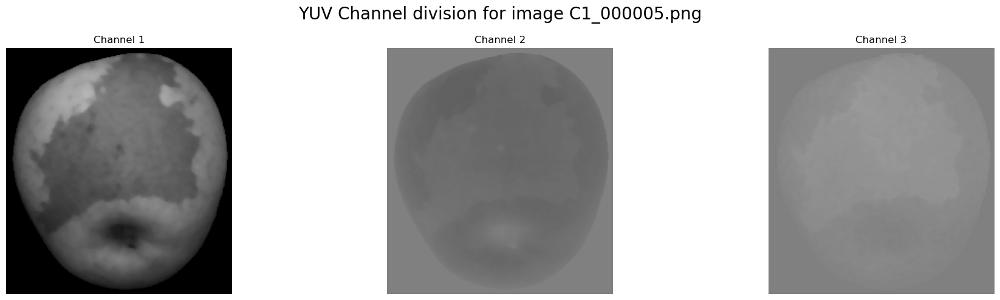

In [14]:
for k in colour_space_dict:
    show_split_channels(colour_space_dict[k], k, imgs_names=[f'Channel {i}' for i in range(1, 4)])

In [15]:
def plot_color_distribution(img, colour_img, title=None, mask=None, channels=None):
    
    
    
    if mask is not None:
        mask = mask.flatten()
    
    fig = plt.figure()
    
    if channels is None or len(channels) == 3:
        ch_1, ch_2, ch_3 = cv2.split(img)
        ch_1 = ch_1.flatten()
        ch_2 = ch_2.flatten()
        ch_3 = ch_3.flatten()
        if mask is not None:
            ch_1 = ch_1[mask != 0]
            ch_2 = ch_2[mask != 0]
            ch_3 = ch_3[mask != 0]
        axis = fig.add_subplot(1, 1, 1, projection="3d")
        pixel_colors = cv2.cvtColor(colour_img, cv2.COLOR_BGR2RGB).reshape((-1, 3))
        if mask is not None:
            pixel_colors = pixel_colors[mask != 0]
        norm = colors.Normalize(vmin=-1.,vmax=1.)
        norm.autoscale(pixel_colors)
        pixel_colors = norm(pixel_colors).tolist()
        axis.scatter(ch_1, ch_2, ch_3, facecolors=pixel_colors, marker=".")
        axis.set_xlabel("Channel 1")
        axis.set_ylabel("Channel 2")
        axis.set_zlabel("Channel 3")
    else:
        ch_1, ch_2 = cv2.split(img[:,:,channels])
        ch_1 = ch_1.flatten()
        ch_2 = ch_2.flatten()
        if mask is not None:
            ch_1 = ch_1[mask != 0]
            ch_2 = ch_2[mask != 0]
        pixel_colors = cv2.cvtColor(colour_img, cv2.COLOR_BGR2RGB).reshape((-1, 3))
        if mask is not None:
            pixel_colors = pixel_colors[mask != 0]
        norm = colors.Normalize(vmin=-1.,vmax=1.)
        norm.autoscale(pixel_colors)
        pixel_colors = norm(pixel_colors).tolist()
        plt.scatter(ch_1, ch_2, facecolors=pixel_colors, marker=".")
        plt.xlabel("Channel 1")
        plt.ylabel("Channel 2")
    if title is not None:
        plt.suptitle(title)
    plt.show()

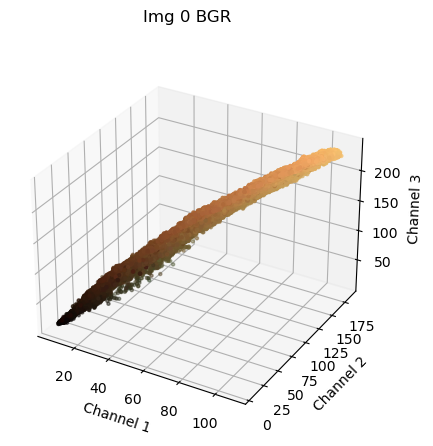

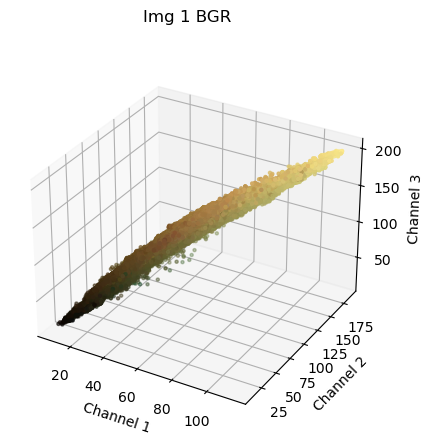

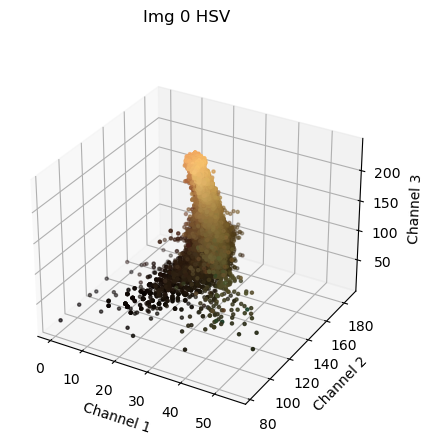

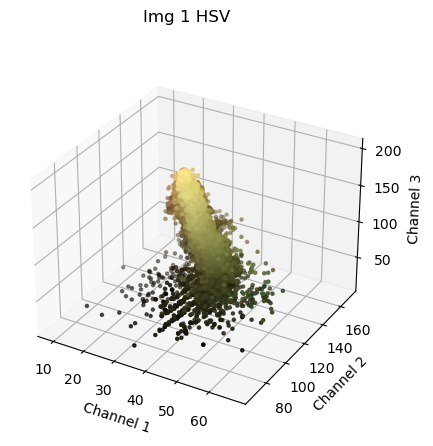

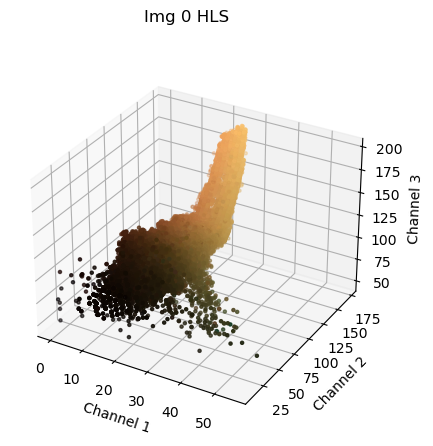

...

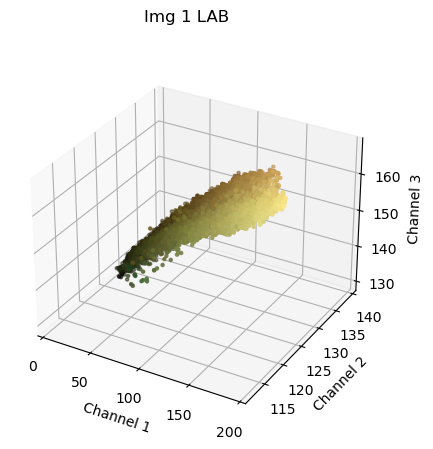

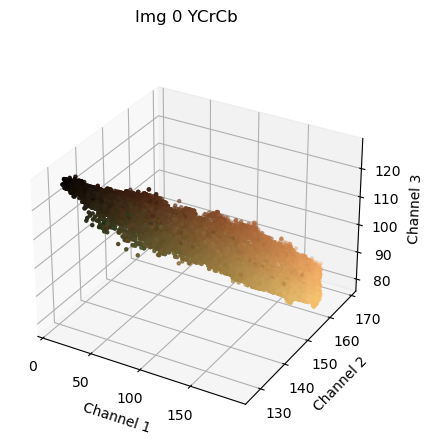

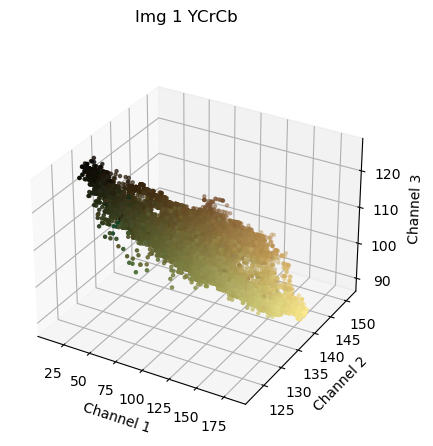

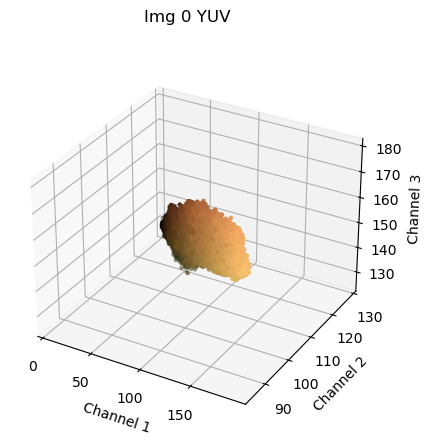

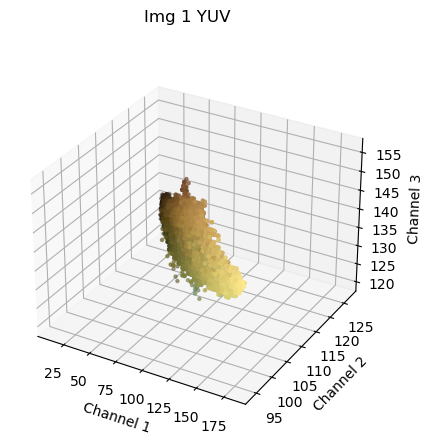

In [16]:
for k in colour_space_dict:
    plot_color_distribution(colour_space_dict[k][0], colour_imgs[0], f'Img 0 {k}', masks[0])
    plot_color_distribution(colour_space_dict[k][1], colour_imgs[1], f'Img 1 {k}', masks[1])

In [17]:
#
colour_space_significant_channels_dict = {
    'BGR': [1, 2],
    'HSV': [0, 1],
    'HLS': [0, 2],
    'LUV': [1, 2],
    'LAB': [1, 2],
    'YCrCb': [1, 2],
    'YUV': [1, 2]
}

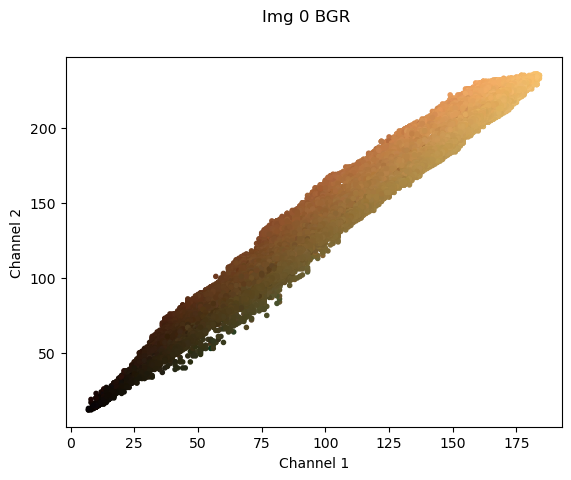

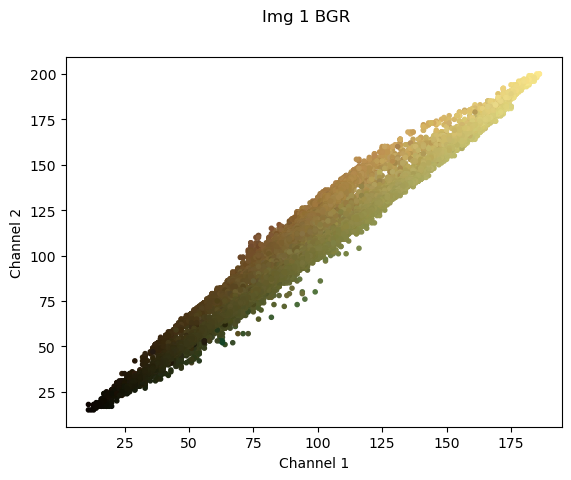

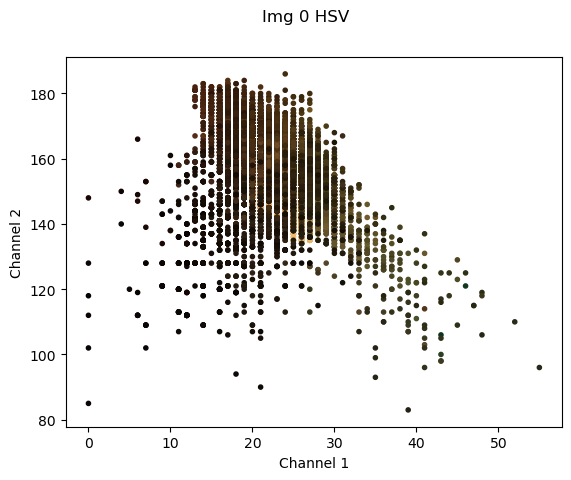

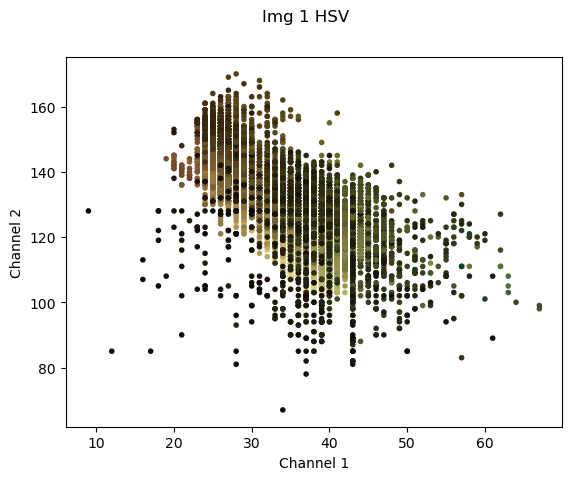

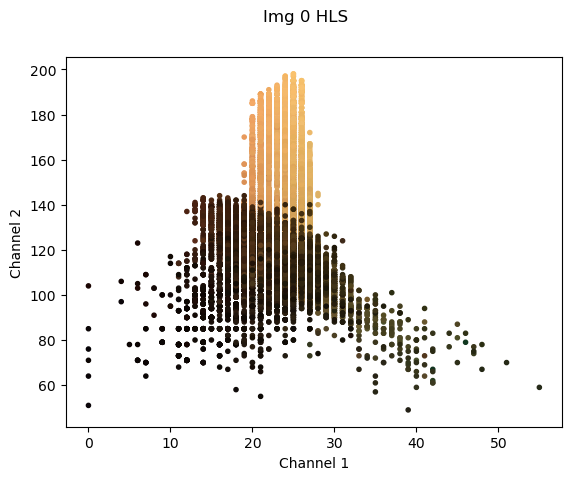

...

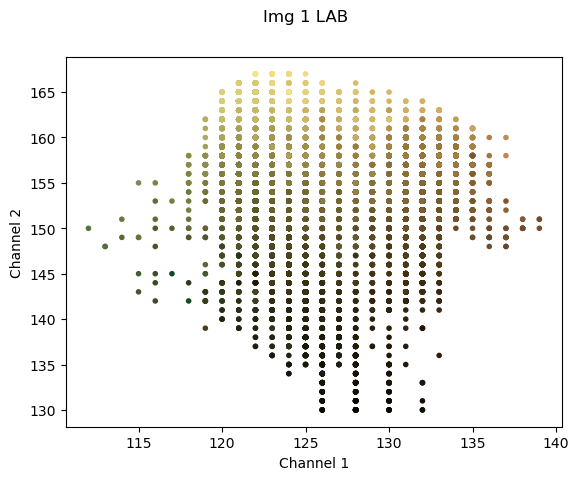

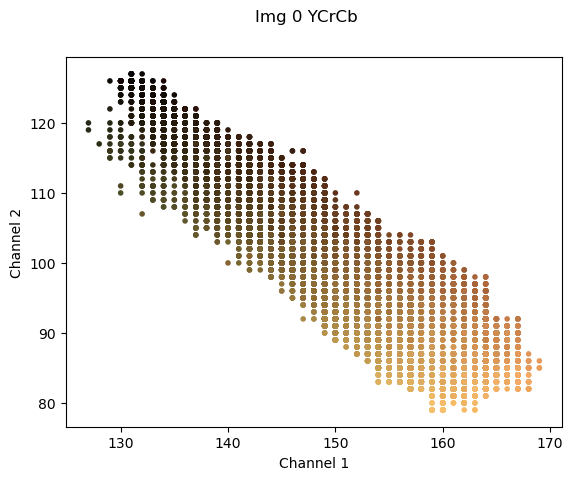

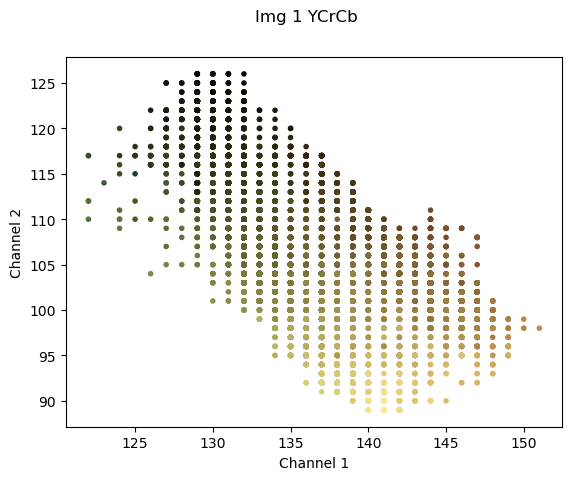

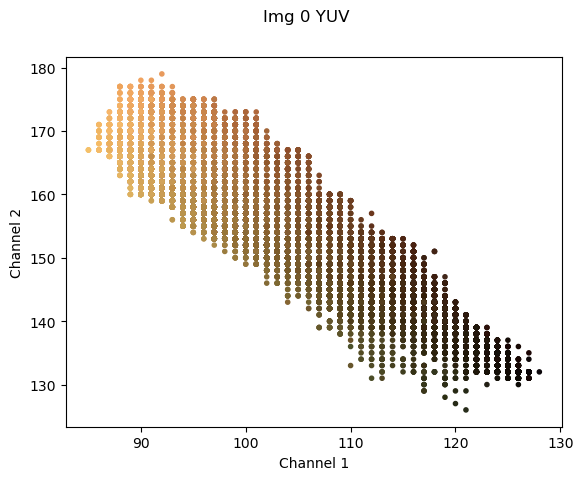

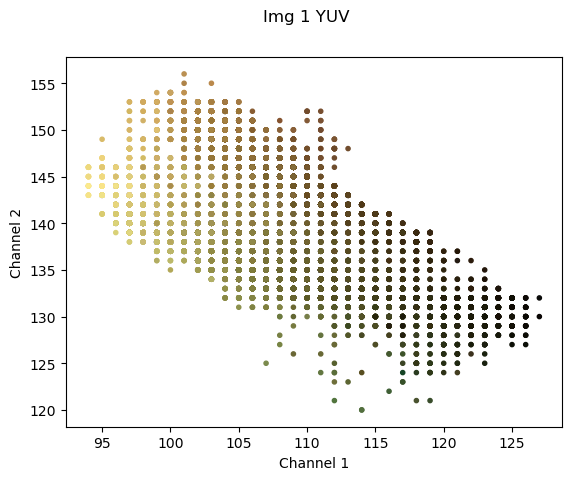

In [18]:
for k in colour_space_dict:
    plot_color_distribution(colour_space_dict[k][0], colour_imgs[0], f'Img 0 {k}', masks[0], colour_space_significant_channels_dict[k])
    plot_color_distribution(colour_space_dict[k][1], colour_imgs[1], f'Img 1 {k}', masks[1], colour_space_significant_channels_dict[k])

In [19]:
def get_k_means_segmentation(img, channels, centers=3):
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.)
    flags = cv2.KMEANS_RANDOM_CENTERS
    
    '''n=  0
    while(n < 1):
        img = cv2.pyrDown(img)
        n +=  1''';
    
    Z = np.copy(img)
    Z = Z[:,:,channels]
    Z = Z.reshape(-1,len(channels))
    Z = np.float32(Z)

    _, labels, _ = cv2.kmeans(Z, centers, None, criteria, 10, flags)

    labels_map = list(np.linspace(0, 255, num=centers, dtype=np.uint8))
    
    print(np.unique(labels))
    print(labels_map)
    
    new_labels = np.copy(labels)
    
    for i, l in enumerate(np.unique(labels)):
        new_labels[labels == l] = labels_map[i]
    
    #labels[labels == 1] = 255 // 2
    #labels[labels == 2] = 255 
    #labels[labels == 2] = 255
    res = new_labels.reshape(img.shape[0], img.shape[1])

    return res.astype('uint8')

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


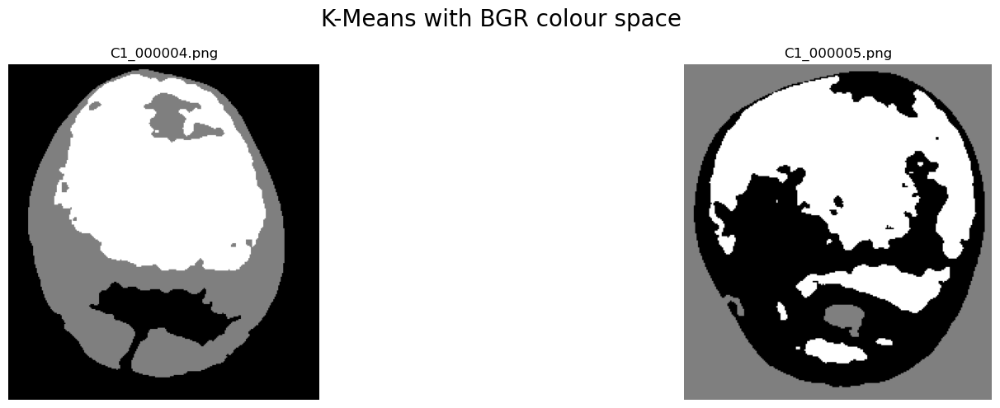

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


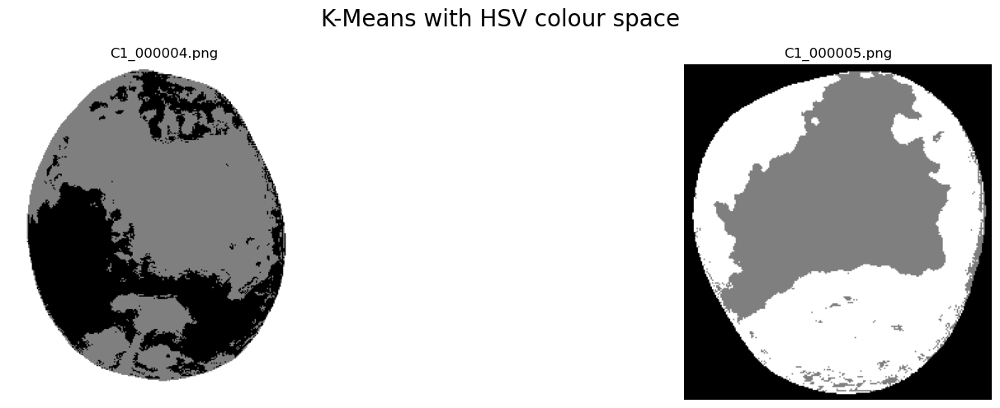

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


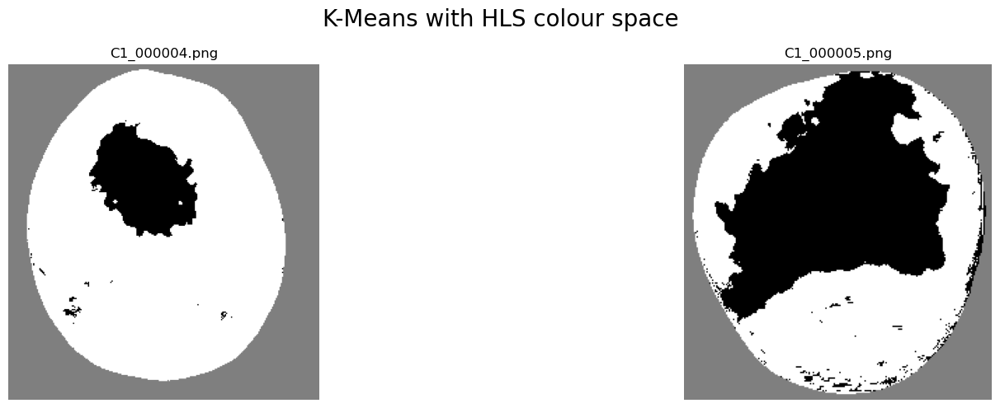

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


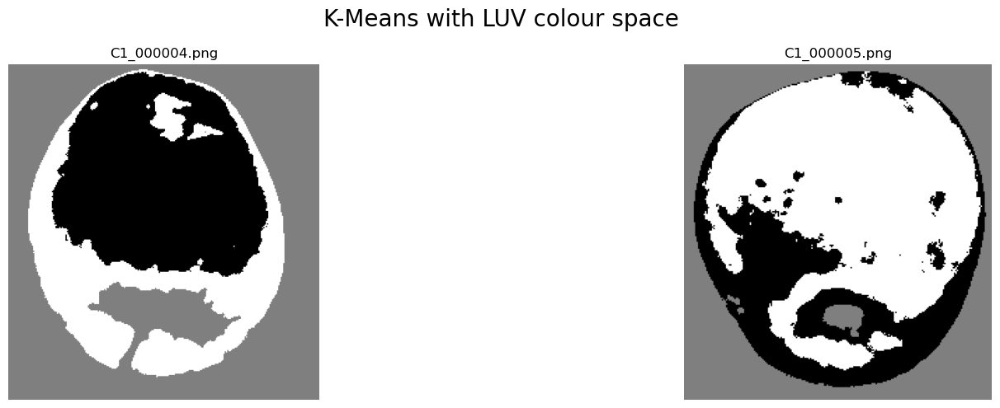

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


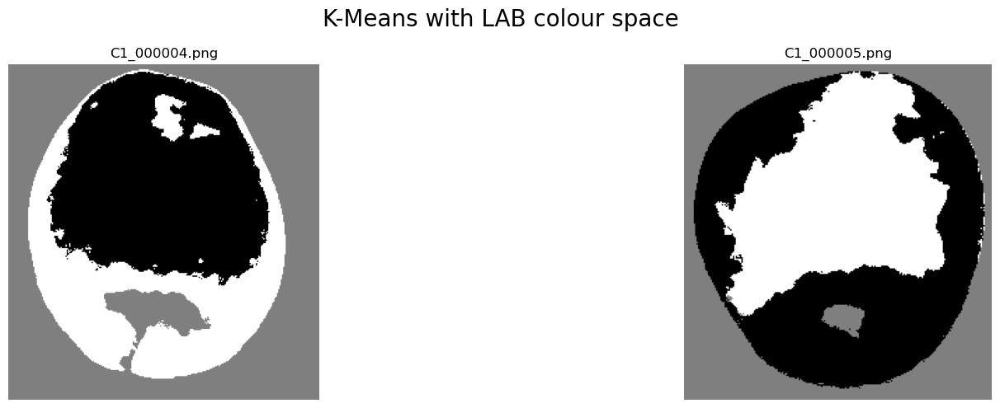

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


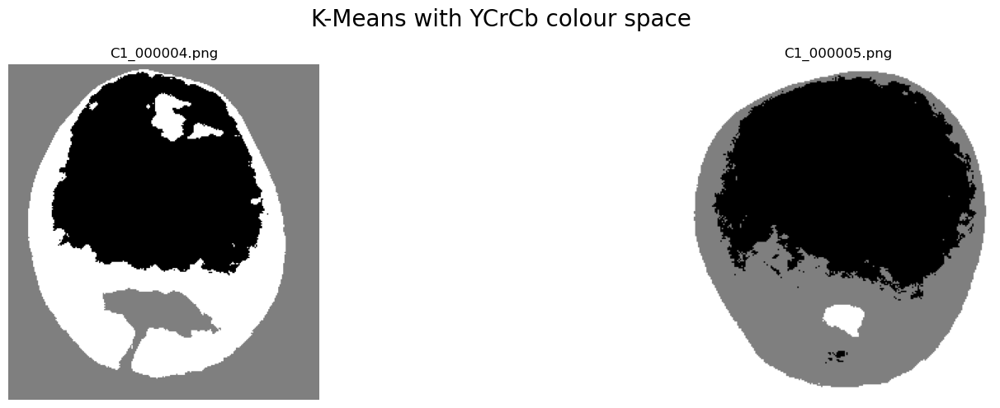

[0 1 2]
[0, 127, 255]
[0 1 2]
[0, 127, 255]


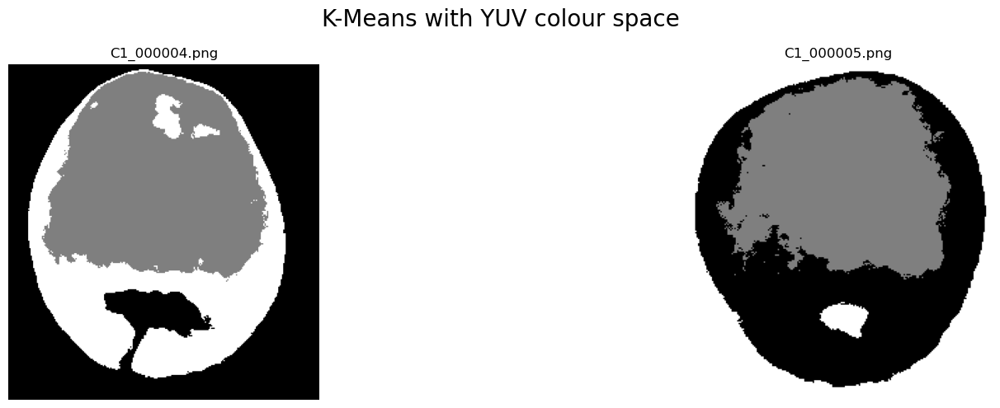

In [20]:

for k in colour_space_dict:
    res = []
    for img in colour_space_dict[k]:
        res.append(get_k_means_segmentation(img, colour_space_significant_channels_dict[k], 3))
    plot_image_grid(res, f'K-Means with {k} colour space', colour_names)

[0 1 2]
[0, 127, 255]


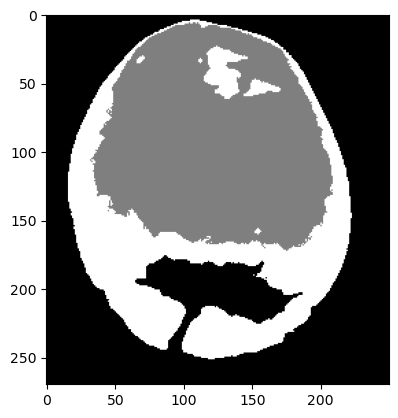

In [21]:
kmeans_luv = get_k_means_segmentation(colour_space_dict['LUV'][0], colour_space_significant_channels_dict['LUV'])
plt.imshow(kmeans_luv, cmap='gray', vmin=0, vmax=255)
plt.show()

In [22]:
roi_1_1_mask = 255 - kmeans_luv

element = cv2.getStructuringElement(0, (15, 15))
eroded_mask = cv2.erode(masks[0], element)

In [23]:
roi_1_1_mask = roi_1_1_mask & eroded_mask
roi_1_1_mask[roi_1_1_mask == 255 // 2 + 1] = 0

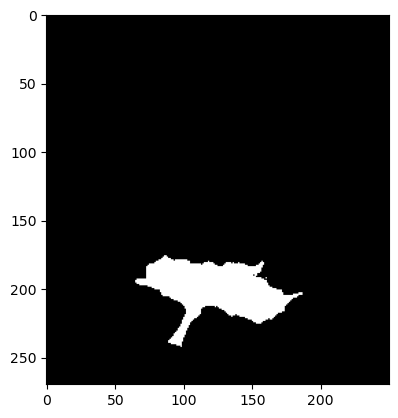

In [24]:
plt.imshow(roi_1_1_mask, cmap='gray', vmin=0, vmax=255)
plt.show()

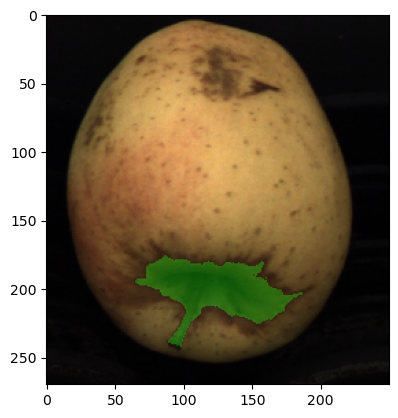

In [25]:
green_mask = cv2.cvtColor(roi_1_1_mask, cv2.COLOR_GRAY2BGR)
# Force the bits of every channel except the green at 0
green_mask[:,:,::2] = 0
highlighted_roi = cv2.addWeighted(green_mask, 0.3, colour_imgs[0], 1, 0)
plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
plt.show()

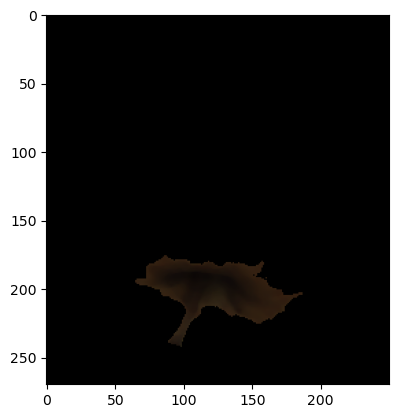

In [26]:
roi_1_1 = masked_filtered_imgs[0] & cv2.cvtColor(roi_1_1_mask, cv2.COLOR_GRAY2BGR)
plt.imshow(cv2.cvtColor(roi_1_1, cv2.COLOR_BGR2RGB))
plt.show()

In [27]:
roi_1_2_mask = np.copy(kmeans_luv)
cv2.floodFill(roi_1_2_mask, None, (0, 0), 255)
cv2.floodFill(roi_1_2_mask, None, (0, 0), 255 // 2)
#roi_1_2_mask[roi_1_2_mask == 0] = 255
roi_1_2_mask[roi_1_2_mask == 255 // 2] = 0

In [28]:
'''green_mask = cv2.cvtColor(roi_1_2_mask, cv2.COLOR_GRAY2BGR)
# Force the bits of every channel except the green at 0
green_mask[:,:,::2] = 0
highlighted_roi = cv2.addWeighted(green_mask, 0.3, colour_imgs[0], 1, 0)
plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
plt.show()''';

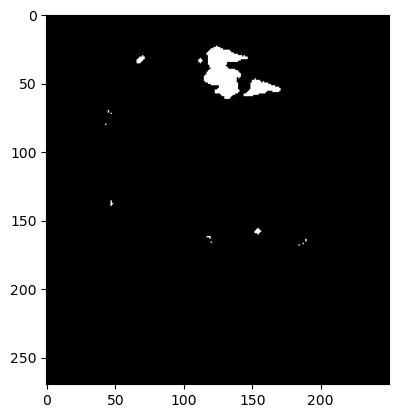

In [29]:
plt.imshow(roi_1_2_mask, cmap='gray', vmin=0, vmax=255)
plt.show()

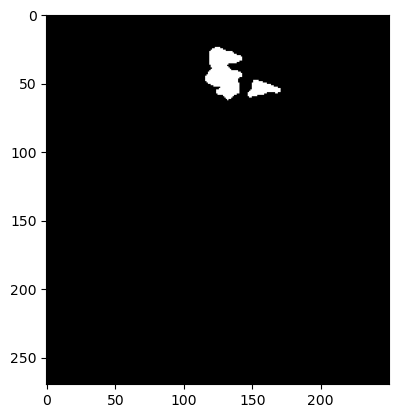

In [30]:
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4, 4))
roi_1_2_mask = cv2.morphologyEx(roi_1_2_mask, cv2.MORPH_OPEN, element)
plt.imshow(roi_1_2_mask, cmap='gray', vmin=0, vmax=255)
plt.show()

In [31]:
#roi_1_2_mask =  kmeans_luv_roi_1 + kmeans_luv_roi_2

In [32]:
#plt.imshow(roi_mask_1, cmap='gray', vmin=0, vmax=255)
#plt.show()

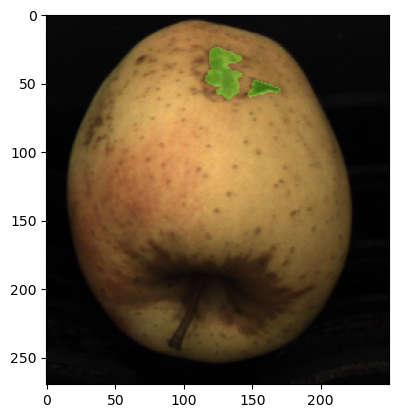

In [33]:
green_mask = cv2.cvtColor(roi_1_2_mask, cv2.COLOR_GRAY2BGR)
# Force the bits of every channel except the green at 0
green_mask[:,:,::2] = 0
highlighted_roi = cv2.addWeighted(green_mask, 0.3, colour_imgs[0], 1, 0)
plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
plt.show()

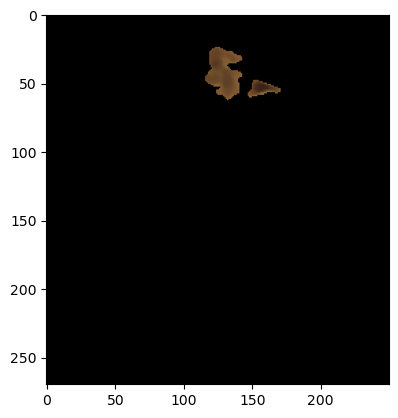

In [34]:
roi_1_2 = masked_filtered_imgs[0] & cv2.cvtColor(roi_1_2_mask, cv2.COLOR_GRAY2BGR)
plt.imshow(cv2.cvtColor(roi_1_2, cv2.COLOR_BGR2RGB))
plt.show()

[0 1 2]
[0, 127, 255]


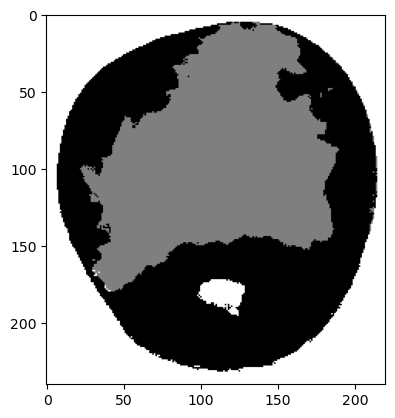

In [35]:
# We take just the LAB color space 
# We take just second kmeans image as a sample
kmeans_lab = get_k_means_segmentation(colour_space_dict['LAB'][1], colour_space_significant_channels_dict['LAB'])
plt.imshow(kmeans_lab, cmap='gray', vmin=0, vmax=255)
plt.show()

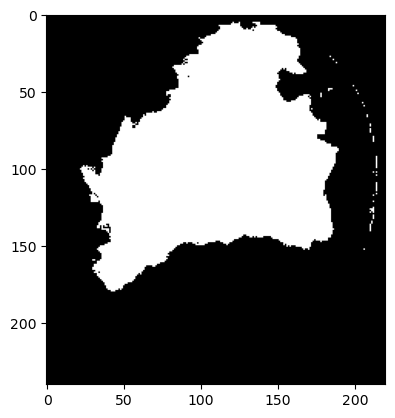

In [36]:
kmeans_lab[kmeans_lab == 255] = 0
kmeans_lab[kmeans_lab == 255 // 2] = 255
roi_mask_2 = kmeans_lab
plt.imshow(roi_mask_2, cmap='gray', vmin=0, vmax=255)
plt.show()

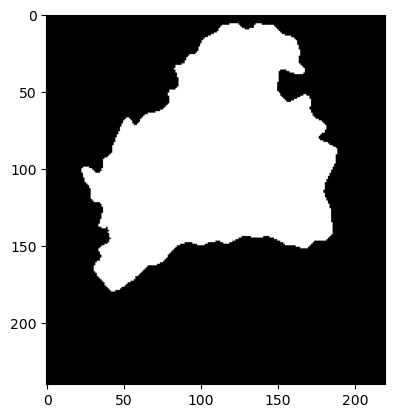

In [37]:
roi_mask_2 = cv2.medianBlur(roi_mask_2, 5)
plt.imshow(roi_mask_2, cmap='gray', vmin=0, vmax=255)
plt.show()

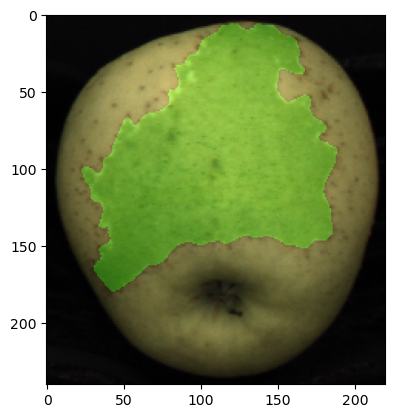

In [38]:
green_mask = cv2.cvtColor(roi_mask_2, cv2.COLOR_GRAY2BGR)
# Force the bits of every channel except the green at 0
green_mask[:,:,::2] = 0
highlighted_roi = cv2.addWeighted(green_mask, 0.3, colour_imgs[1], 1, 0)
plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
plt.show()

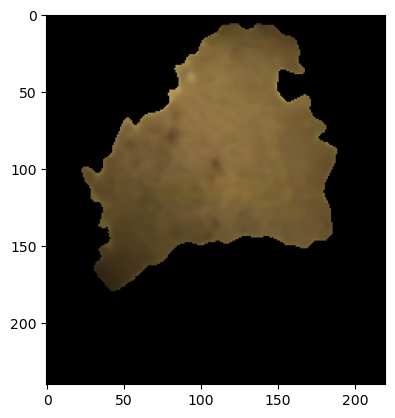

In [39]:
roi_2 = masked_filtered_imgs[1] & cv2.cvtColor(roi_mask_2, cv2.COLOR_GRAY2BGR)
plt.imshow(cv2.cvtColor(roi_2, cv2.COLOR_BGR2RGB))
plt.show()

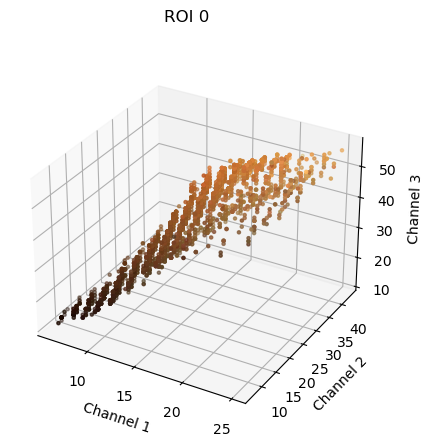

In [40]:
plot_color_distribution(roi_1_1, colour_imgs[0], f'ROI 0', roi_1_1_mask)

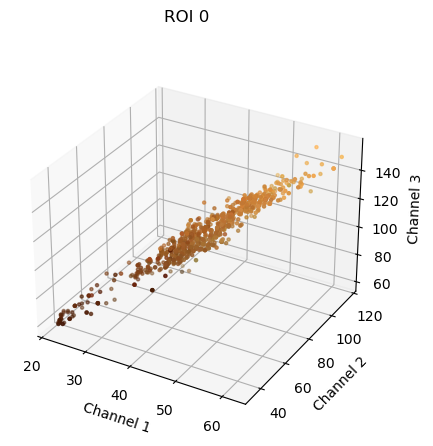

In [41]:
plot_color_distribution(roi_1_2, colour_imgs[0], f'ROI 0', roi_1_2_mask)

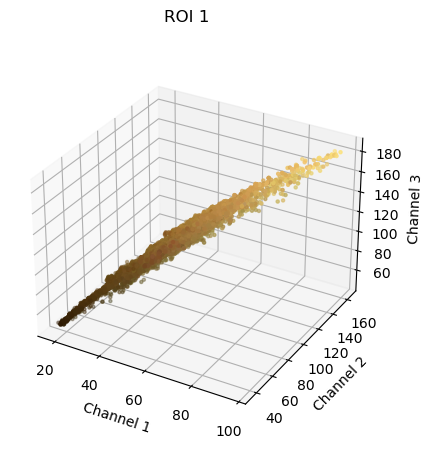

In [42]:
plot_color_distribution(roi_2, colour_imgs[1], f'ROI 1', roi_mask_2)

## Extracting patches for each ROI

In [43]:
def get_samples(roi, num_samples, patch_size):
    # Get all patches of size (`patch_size`, `patch_size`) from the image
    patches = list(extract_patches_2d(roi, (patch_size, patch_size), random_state=SEED))
    # Extract just the patches of the ROI
    roi_patches = [p for p in patches if np.all(p)]
    # Get index of `num_samples` randomly chosen samples
    samples_idx = np.random.choice(np.arange(len(roi_patches)), num_samples, replace=False)
    # Get samples based on the obtained random indices
    return [roi_patches[i] for i in samples_idx]

In [44]:
#TOTAL_NUM_PATCHES = 1_000

In [45]:
samples = get_samples(roi_1_1, 200, 5)
samples += get_samples(roi_1_2, 200, 5)
samples += get_samples(roi_2, 200, 5)

In [46]:
'''patches_1 = list(extract_patches_2d(roi_1, (3, 3)))
roi_1_patches = [p for p in patches_1 if np.all(p)]
print(len(roi_1_patches))
samples_idx = np.random.choice(np.arange(len(roi_1_patches)), 500, replace=True)
samples = [roi_1_patches[i] for i in samples_idx]''';

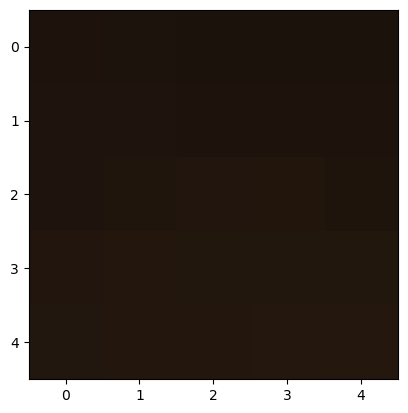

In [47]:
plt.imshow(cv2.cvtColor(samples[0], cv2.COLOR_BGR2RGB))

In [48]:
'''patches_2 = list(extract_patches_2d(roi_2, (50, 50)))
roi_2_patches = [p for p in patches_2 if np.all(p)]
print(len(roi_2_patches))
samples_2_idx = np.random.choice(np.arange(len(roi_2_patches)), 500, replace=False)

#samples += [roi_2_patches[i] for i in samples_2_idx]''';

In [49]:
'''plt.imshow(cv2.cvtColor(samples[-1], cv2.COLOR_BGR2RGB))''';

In [50]:
'''def adjust_contrast(s, alpha=.5, beta=10):

    new_image = np.zeros(s.shape, s.dtype)

    for y in range(s.shape[0]):
        for x in range(s.shape[1]):
            for c in range(s.shape[2]):
                new_image[y,x,c] = np.clip(alpha*s[y,x,c] + beta, 0, 255)
    return new_image''';

In [51]:
'''plt.imshow(cv2.cvtColor(adjust_contrast(samples[0]), cv2.COLOR_BGR2RGB))''';

In [52]:
'''samples = samples + [adjust_contrast(s) for s in samples]''';

In [53]:
def get_mean_and_covariance_matrix(samples, colour_space_fun, channel_num):
    covariance_tot = np.zeros((channel_num, channel_num), dtype='float32')
    mean_tot = np.zeros((channel_num,), dtype='float32')

    # CHANGE THE COLOR SPACE OF cvtColor TO THE DEFINED ONE

    for s in samples:
        # s_ab = cv2.cvtColor(s, cv2.COLOR_BGR2LAB)[:, :, channels]
        s_colour_space = colour_space_fun(s)

        s_colour_space = s_colour_space.reshape(-1, channel_num)
        cov, mean = cv2.calcCovarMatrix(s_colour_space, None, cv2.COVAR_NORMAL + cv2.COVAR_ROWS + cv2.COVAR_SCALE)
        covariance_tot = np.add(covariance_tot, cov)
        mean_tot = np.add(mean_tot, mean)

    mean = mean_tot / len(samples)
    print(covariance_tot)
    print(mean)
    covariance = covariance_tot / len(samples)
    return mean, covariance

In [54]:
# inv_covariance_matrix = np.linalg.inv(covariance_tot)

In [55]:
def get_mahalanobis_distance_img(img, samples, colour_space_fun):
    img = colour_space_fun(img)
    channel_num = img.shape[2]
    # TODO ASSERT
    ##    assert channel_num > 1 , \
    ##    'At least two channels need to be provided.'
    
    mean, covariance = get_mean_and_covariance_matrix(samples, colour_space_fun, channel_num)
    inv_covariance_matrix = np.linalg.inv(covariance)
    
    #print(img.shape)

    img_flattened = img.reshape(-1, channel_num)
    img_flattened = img_flattened.astype(np.float64)
    print(img_flattened[0])
    print(mean)
    
    #img_res = [sc.spatial.distance.cdist(np.array([i]), mean, 'mahalanobis', VI=inv_covariance_matrix) for i in img_flattened]
    
    img_res = [
        cv2.Mahalanobis(i, mean[0], inv_covariance_matrix)  #if i[0] != 0 and i[1] != 0 else 200  
        for i in img_flattened
    ]
    
    img_res = np.array(img_res)
    #print(img_res.shape)
    img_res = img_res.reshape((img.shape[0], img.shape[1], 1));
    
    return img_res

In [56]:
def plot_tresholded_image(img, img_distance, treshold):
    #img_tresh = np.copy(img)

    img_distance[img_distance > treshold] = 0

    green_mask = cv2.cvtColor(img_distance.astype(np.uint8), cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    green_mask[green_mask != 0] = 255
    highlighted_roi = cv2.addWeighted(green_mask, 1, img, 1, 0)
    plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
    plt.show()

[[ 554.96    -82.2928]
 [ -82.2928 1190.5568]]
[[134.09146667 147.22213333]]
[128. 128.]
[[134.09146667 147.22213333]]


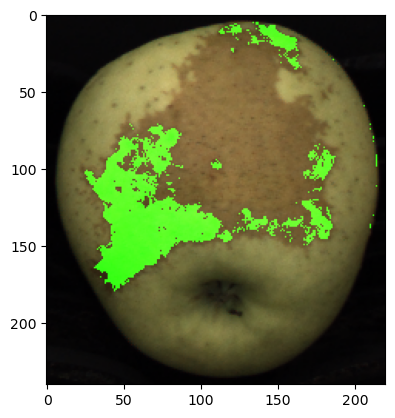

[[ 554.96    -82.2928]
 [ -82.2928 1190.5568]]
[[134.09146667 147.22213333]]
[128. 128.]
[[134.09146667 147.22213333]]


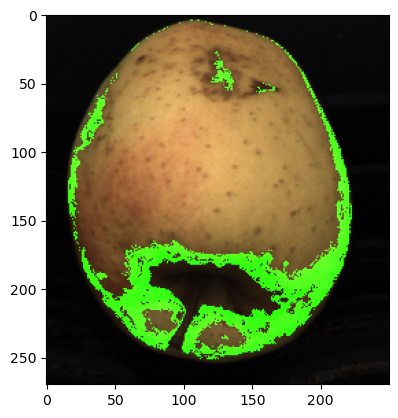

In [57]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2LAB)[:,:,colour_space_significant_channels_dict['LAB']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 5)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 5)

[[ 519.8176  428.8192]
 [ 428.8192 1555.8592]]
[[107.54673333 154.12086667]]
[ 96. 136.]
[[107.54673333 154.12086667]]


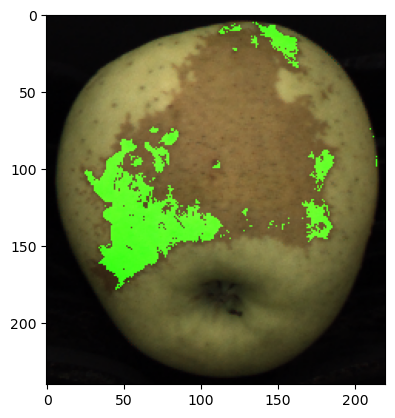

[[ 519.8176  428.8192]
 [ 428.8192 1555.8592]]
[[107.54673333 154.12086667]]
[ 96. 136.]
[[107.54673333 154.12086667]]


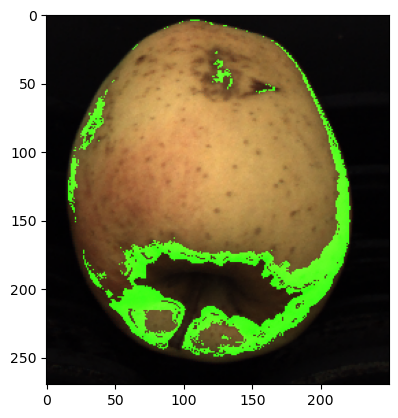

In [58]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2Luv)[:,:,colour_space_significant_channels_dict['LUV']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 5)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 5)

[[ 522.2688 -408.56  ]
 [-408.56   1132.736 ]]
[[141.36026667 110.8558    ]]
[128. 128.]
[[141.36026667 110.8558    ]]


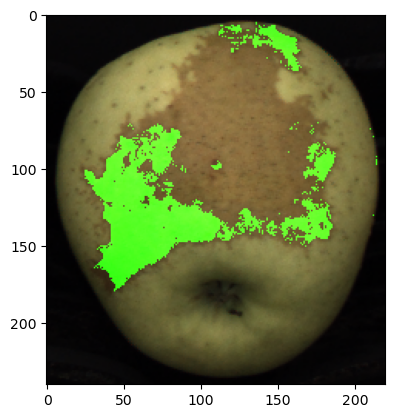

[[ 522.2688 -408.56  ]
 [-408.56   1132.736 ]]
[[141.36026667 110.8558    ]]
[128. 128.]
[[141.36026667 110.8558    ]]


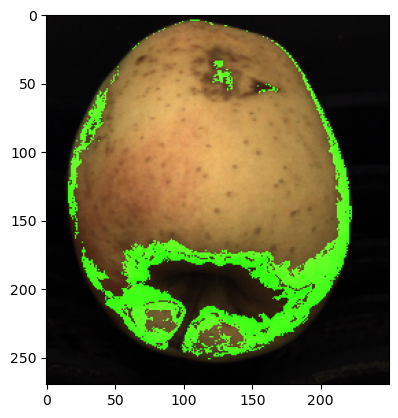

In [59]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)[:,:,colour_space_significant_channels_dict['YCrCb']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 5)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 5)

[[ 1233.9552   373.656 ]
 [  373.656  10711.0304]]
[[ 21.88646667 149.08686667]]
[0. 0.]
[[ 21.88646667 149.08686667]]


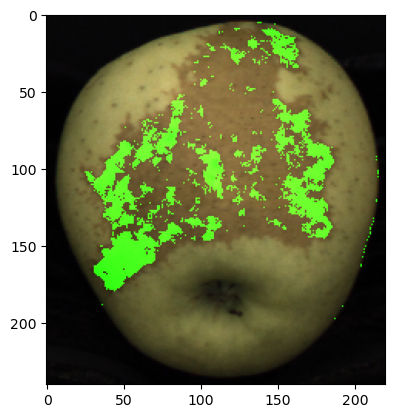

[[ 1233.9552   373.656 ]
 [  373.656  10711.0304]]
[[ 21.88646667 149.08686667]]
[0. 0.]
[[ 21.88646667 149.08686667]]


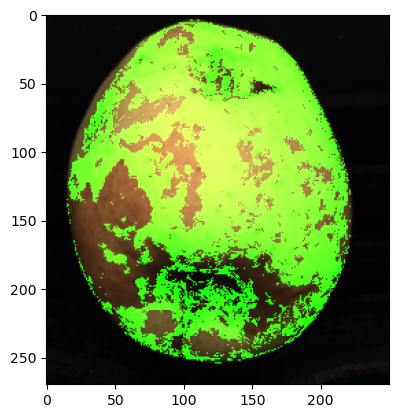

In [60]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2HSV_FULL)[:,:,colour_space_significant_channels_dict['HSV']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res,4)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res,4)

[[ 1203.4304   276.7984]
 [  276.7984 10246.2176]]
[[ 21.286  105.1542]]
[0. 0.]
[[ 21.286  105.1542]]


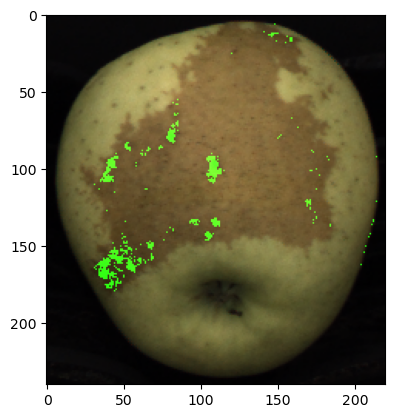

[[ 1203.4304   276.7984]
 [  276.7984 10246.2176]]
[[ 21.286  105.1542]]
[0. 0.]
[[ 21.286  105.1542]]


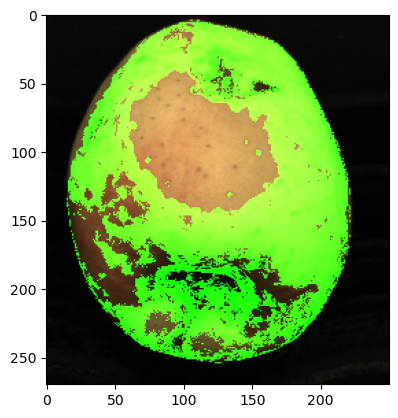

In [61]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2HLS_FULL)[:,:,colour_space_significant_channels_dict['HLS']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res,3)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res,5)

[[  880.2592 -1107.7888  -569.9296  -559.6672]
 [-1107.7888  1555.8592   795.7696   786.192 ]
 [ -569.9296   795.7696  1233.9552  1152.3072]
 [ -559.6672   786.192   1152.3072  1203.4304]]
[[113.0596     154.12086667  21.88646667  21.286     ]]
[128. 136.   0.   0.]
[[113.0596     154.12086667  21.88646667  21.286     ]]


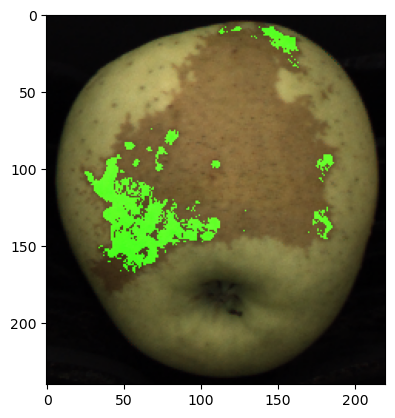

[[  880.2592 -1107.7888  -569.9296  -559.6672]
 [-1107.7888  1555.8592   795.7696   786.192 ]
 [ -569.9296   795.7696  1233.9552  1152.3072]
 [ -559.6672   786.192   1152.3072  1203.4304]]
[[113.0596     154.12086667  21.88646667  21.286     ]]
[128. 136.   0.   0.]
[[113.0596     154.12086667  21.88646667  21.286     ]]


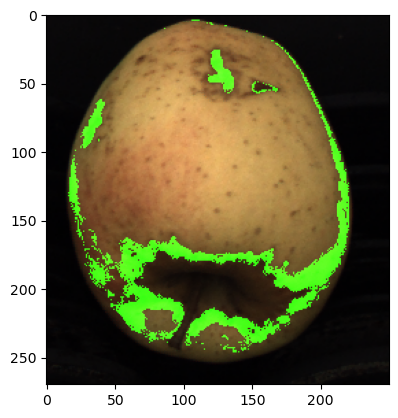

In [62]:
def colour_space_fun(img):
    yuv_1 =  cv2.cvtColor(img, cv2.COLOR_BGR2YUV)[:,:,1]
    luv_2 = cv2.cvtColor(img, cv2.COLOR_BGR2Luv)[:,:,2]
    hsv_0 =  cv2.cvtColor(img, cv2.COLOR_BGR2HSV_FULL)[:,:,0]
    hls_0 = cv2.cvtColor(img, cv2.COLOR_BGR2HLS_FULL)[:,:,0]

    yuv_1 = np.expand_dims(yuv_1, axis=2)
    luv_2 = np.expand_dims(luv_2, axis=2)
    hsv_0 = np.expand_dims(hsv_0, axis=2)
    hls_0 = np.expand_dims(hls_0, axis=2)

    return np.concatenate((yuv_1, luv_2, hsv_0, hls_0), axis = -1)

img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 5)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 5)

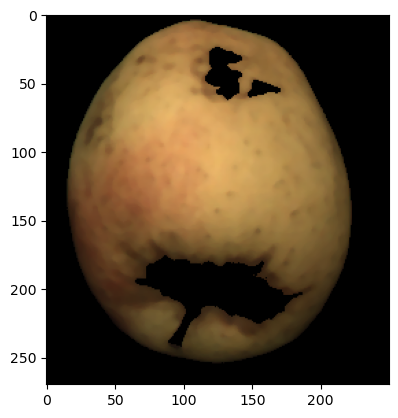

In [63]:
roi_1_mask_inverse = 255 - (roi_1_2_mask + roi_1_1_mask)
roi_1_mask_inverse = roi_1_mask_inverse & masks[0]

roi_1_inverse = masked_filtered_imgs[0] & cv2.cvtColor(roi_1_mask_inverse, cv2.COLOR_GRAY2BGR)
plt.imshow(cv2.cvtColor(roi_1_inverse, cv2.COLOR_BGR2RGB))
plt.show()

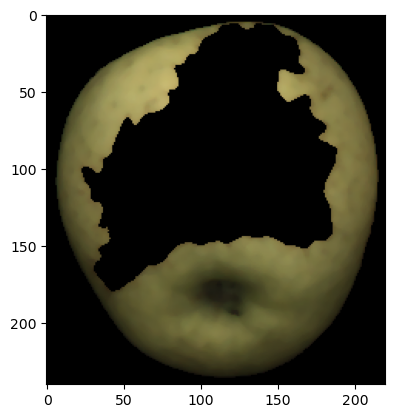

In [64]:
roi_2_mask_inverse = 255 - roi_mask_2
roi_2_mask_inverse = roi_2_mask_inverse & masks[1]

roi_2_inverse = masked_filtered_imgs[1] & cv2.cvtColor(roi_2_mask_inverse, cv2.COLOR_GRAY2BGR)
plt.imshow(cv2.cvtColor(roi_2_inverse, cv2.COLOR_BGR2RGB))
plt.show()

In [65]:
def plot_tresholded_image(img, img_distance, treshold):
    img_distance[img_distance > treshold] = 0

    green_mask = cv2.cvtColor(img_distance.astype(np.uint8), cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    green_mask[green_mask != 0] = 255
    highlighted_roi = cv2.addWeighted(green_mask, 1, img, 1, 0)
    plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
    plt.show()

In [66]:
samples_1 = get_samples(roi_1_inverse, 5_000, 20)
samples_2 = get_samples(roi_2_inverse, 5_000, 11)

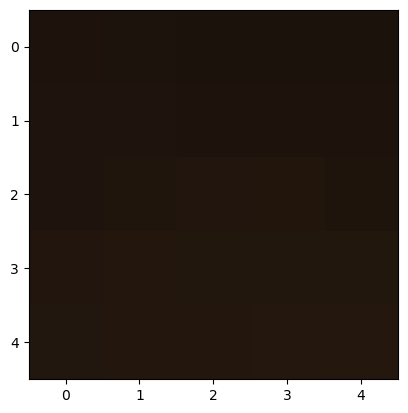

In [67]:
plt.imshow(cv2.cvtColor(samples[0], cv2.COLOR_BGR2RGB))

[[13383.52465     1189.11614375]
 [ 1189.11614375 23125.82301875]]
[[138.277804  163.9231145]]
[128. 128.]
[[138.277804  163.9231145]]


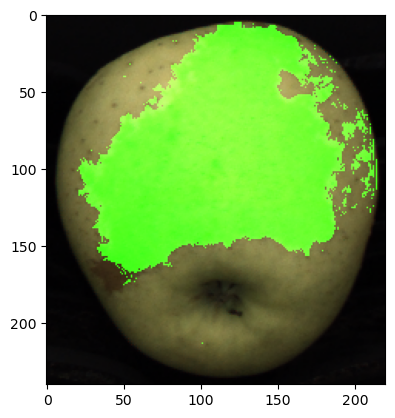

[[13383.52465     1189.11614375]
 [ 1189.11614375 23125.82301875]]
[[138.277804  163.9231145]]
[128. 128.]
[[138.277804  163.9231145]]


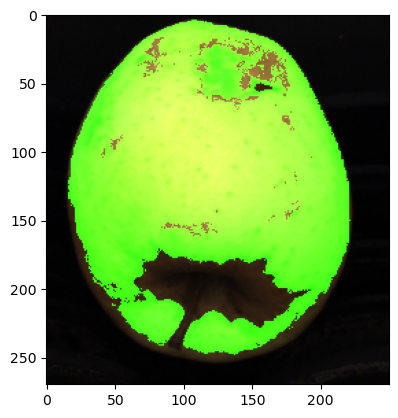

In [68]:
colour_space_fun = lambda img : cv2.cvtColor(img, cv2.COLOR_BGR2LAB)[:,:,colour_space_significant_channels_dict['LAB']]
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_1, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 9)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 9)

In [69]:
def colour_space_fun(img):
    yuv_1 =  cv2.cvtColor(img, cv2.COLOR_BGR2YUV)[:,:,1]
    luv_2 = cv2.cvtColor(img, cv2.COLOR_BGR2Luv)[:,:,2]
    hsv_0 =  cv2.cvtColor(img, cv2.COLOR_BGR2HSV_FULL)[:,:,0]
    hls_0 = cv2.cvtColor(img, cv2.COLOR_BGR2HLS_FULL)[:,:,0]

    yuv_1 = np.expand_dims(yuv_1, axis=2)
    luv_2 = np.expand_dims(luv_2, axis=2)
    hsv_0 = np.expand_dims(hsv_0, axis=2)
    hls_0 = np.expand_dims(hls_0, axis=2)

    return np.concatenate((yuv_1, luv_2, hsv_0, hls_0), axis = -1)

'''img_res = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_2, colour_space_fun) 
plot_tresholded_image(colour_imgs[1], img_res, 7)
img_res = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1, colour_space_fun) 
plot_tresholded_image(colour_imgs[0], img_res, 10''';

[[ 22907.35139375 -31426.67340625  -4255.49815625  -4204.706425  ]
 [-31426.67340625  45181.399475     7560.3679       7481.908075  ]
 [ -4255.49815625   7560.3679       7319.35565      6898.10956875]
 [ -4204.706425     7481.908075     6898.10956875   7298.40178125]]
[[ 97.8359055 174.294391   23.974992   23.7661085]]
[128. 136.   0.   0.]
[[ 97.8359055 174.294391   23.974992   23.7661085]]
[[ 22907.35139375 -31426.67340625  -4255.49815625  -4204.706425  ]
 [-31426.67340625  45181.399475     7560.3679       7481.908075  ]
 [ -4255.49815625   7560.3679       7319.35565      6898.10956875]
 [ -4204.706425     7481.908075     6898.10956875   7298.40178125]]
[[ 97.8359055 174.294391   23.974992   23.7661085]]
[128. 136.   0.   0.]
[[ 97.8359055 174.294391   23.974992   23.7661085]]


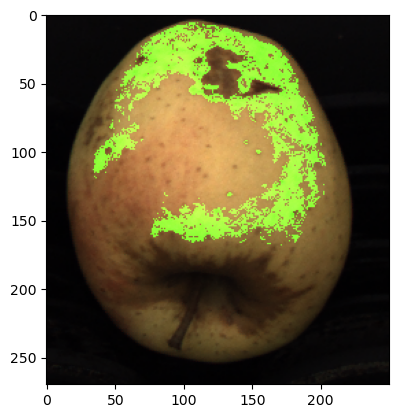

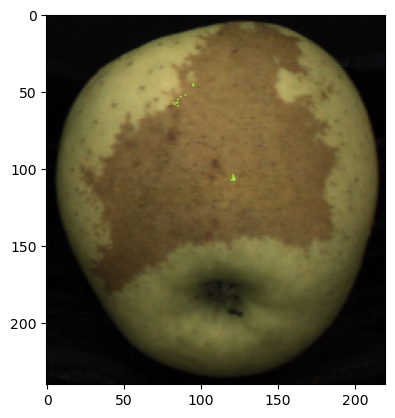

In [70]:
dis_1 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1, colour_space_fun)
#dis_1_s_1_2 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_2, colour_space_fun)
dis_2 = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_1, colour_space_fun)

plot_tresholded_image(colour_imgs[0], dis_1, 3)
plot_tresholded_image(colour_imgs[1], dis_2, 3)

In [71]:
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
dis_1, dis_2 = [cv2.morphologyEx(m, cv2.MORPH_OPEN, element) for m in [dis_1, dis_2]]

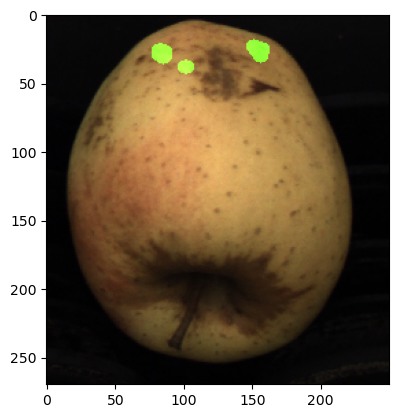

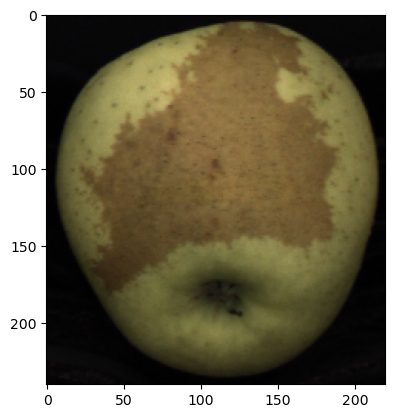

In [72]:
plot_tresholded_image(colour_imgs[0], dis_1, 5)
plot_tresholded_image(colour_imgs[1], dis_2, 5)

[[ 15611.7919541  -23563.38822485   -816.52721809  -1022.00785465]
 [-23563.38822485  37407.08489857   2672.64647224   2920.37524759]
 [  -816.52721809   2672.64647224  12422.93518202  11893.96728366]
 [ -1022.00785465   2920.37524759  11893.96728366  12413.48678369]]
[[107.6836562  165.01913058  39.17474215  38.84126116]]
[128. 136.   0.   0.]
[[107.6836562  165.01913058  39.17474215  38.84126116]]
[[ 15611.7919541  -23563.38822485   -816.52721809  -1022.00785465]
 [-23563.38822485  37407.08489857   2672.64647224   2920.37524759]
 [  -816.52721809   2672.64647224  12422.93518202  11893.96728366]
 [ -1022.00785465   2920.37524759  11893.96728366  12413.48678369]]
[[107.6836562  165.01913058  39.17474215  38.84126116]]
[128. 136.   0.   0.]
[[107.6836562  165.01913058  39.17474215  38.84126116]]


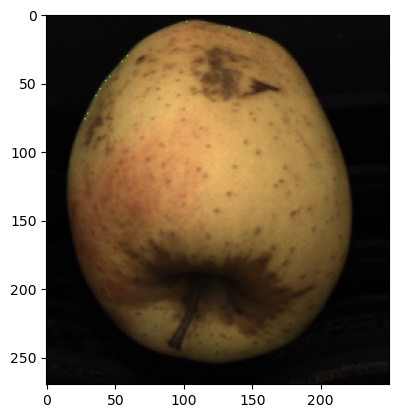

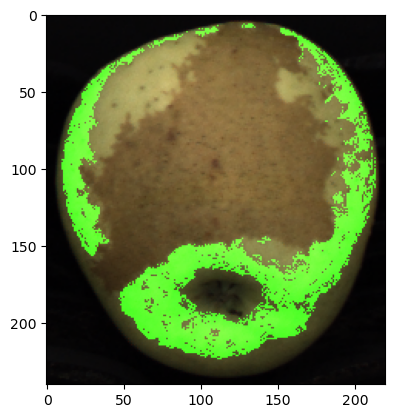

In [73]:
dis_1 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_2, colour_space_fun)
#dis_1_s_1_2 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_2, colour_space_fun)
dis_2 = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_2, colour_space_fun)

plot_tresholded_image(colour_imgs[0], dis_1, 3)
plot_tresholded_image(colour_imgs[1], dis_2, 3)

In [74]:
element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
dis_1, dis_2 = [cv2.morphologyEx(m, cv2.MORPH_OPEN, element) for m in [dis_1, dis_2]]

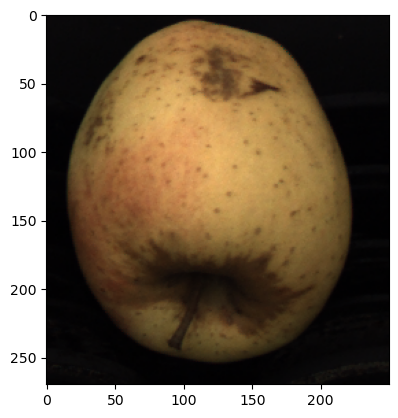

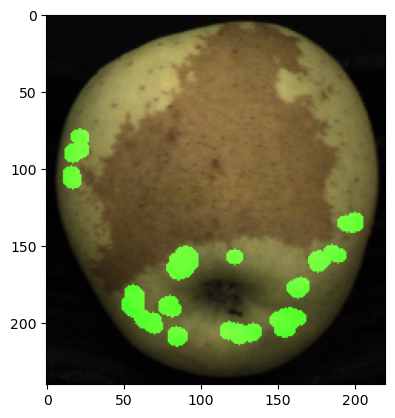

In [75]:
plot_tresholded_image(colour_imgs[0], dis_1, 7)
plot_tresholded_image(colour_imgs[1], dis_2, 7)

In [76]:
def plot_tresholded_image(img, img_distance, treshold):
    img_distance[img_distance > treshold] = 0

    green_mask = cv2.cvtColor(img_distance.astype(np.uint8), cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    green_mask[green_mask != 0] = 255
    highlighted_roi = cv2.addWeighted(green_mask, 1, img, 1, 0)
    plt.imshow(cv2.cvtColor(highlighted_roi, cv2.COLOR_BGR2RGB))
    plt.show()

In [77]:
samples_1_1 = get_samples(roi_1_1, 300, 5)
samples_1_2 = get_samples(roi_1_2, 300, 5)
samples_2 = get_samples(roi_2, 500, 40)

### Good At Extracting darker russet

[[ 193.072  -184.3792 -233.656  -226.4304]
 [-184.3792  228.6624  245.3696  240.0048]
 [-233.656   245.3696 1122.8512 1067.84  ]
 [-226.4304  240.0048 1067.84   1077.7632]]
[[122.75666667 140.66106667  18.20386667  17.6252    ]]
[128. 136.   0.   0.]
[[122.75666667 140.66106667  18.20386667  17.6252    ]]
[[ 193.072  -184.3792 -233.656  -226.4304]
 [-184.3792  228.6624  245.3696  240.0048]
 [-233.656   245.3696 1122.8512 1067.84  ]
 [-226.4304  240.0048 1067.84   1077.7632]]
[[122.75666667 140.66106667  18.20386667  17.6252    ]]
[128. 136.   0.   0.]
[[122.75666667 140.66106667  18.20386667  17.6252    ]]


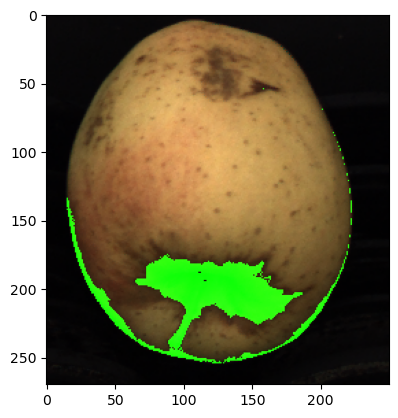

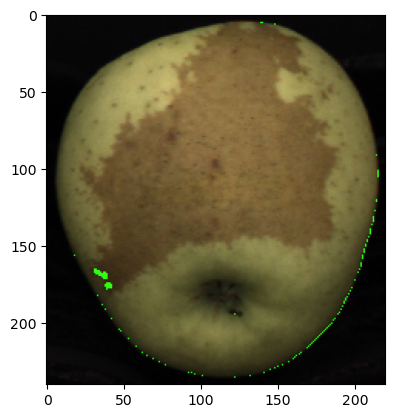

In [78]:
filt = masked_filtered_imgs

dis_1_s_1_1 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_1, colour_space_fun)
dis_2_s_1_1 = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_1_1, colour_space_fun)

plot_tresholded_image(colour_imgs[0], dis_1_s_1_1, 7)
plot_tresholded_image(colour_imgs[1], dis_2_s_1_1, 7)

## Good at extracting small russets

[[ 1128.9728 -1495.592   -655.9536  -657.0208]
 [-1495.592   2074.9376   963.4128   961.9552]
 [ -655.9536   963.4128   745.0208   710.1264]
 [ -657.0208   961.9552   710.1264   742.048 ]]
[[110.02266667 157.59586667  20.4736      19.84813333]]
[128. 136.   0.   0.]
[[110.02266667 157.59586667  20.4736      19.84813333]]
[[ 1128.9728 -1495.592   -655.9536  -657.0208]
 [-1495.592   2074.9376   963.4128   961.9552]
 [ -655.9536   963.4128   745.0208   710.1264]
 [ -657.0208   961.9552   710.1264   742.048 ]]
[[110.02266667 157.59586667  20.4736      19.84813333]]
[128. 136.   0.   0.]
[[110.02266667 157.59586667  20.4736      19.84813333]]


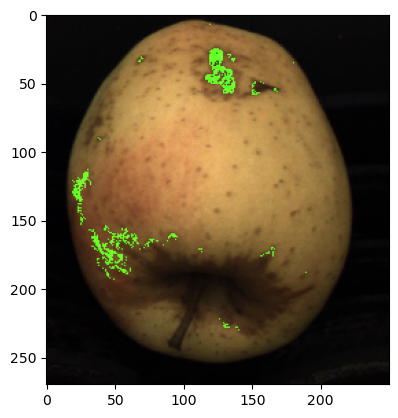

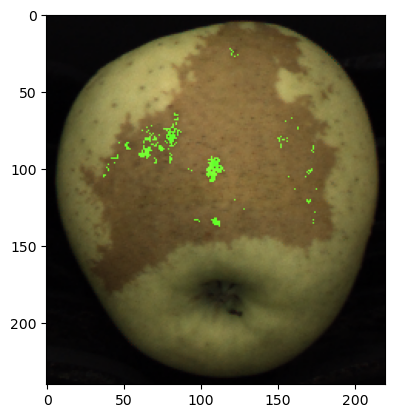

In [79]:
filt = masked_filtered_imgs

dis_1_s_1_1 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_2, colour_space_fun)
#dis_1_s_1_2 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_2, colour_space_fun)
dis_2_s_1_1 = get_mahalanobis_distance_img(masked_filtered_imgs[1], samples_1_2, colour_space_fun)

plot_tresholded_image(colour_imgs[0], dis_1_s_1_1, 2.5)
plot_tresholded_image(colour_imgs[1], dis_2_s_1_1, 4);

### Good at extracting big russet but a lot of false positives on first

[[ 1311.41260625 -1745.60465977  -260.40648398  -261.16965391]
 [-1745.60465977  2498.89968867   428.3457418    425.20328633]
 [ -260.40648398   428.3457418    576.96067969   563.12179609]
 [ -261.16965391   425.20328633   563.12179609   600.39273633]]
[[105.1753     165.94219375  27.1566425   27.04019125]]
[128. 136.   0.   0.]
[[105.1753     165.94219375  27.1566425   27.04019125]]
[[ 1311.41260625 -1745.60465977  -260.40648398  -261.16965391]
 [-1745.60465977  2498.89968867   428.3457418    425.20328633]
 [ -260.40648398   428.3457418    576.96067969   563.12179609]
 [ -261.16965391   425.20328633   563.12179609   600.39273633]]
[[105.1753     165.94219375  27.1566425   27.04019125]]
[128. 136.   0.   0.]
[[105.1753     165.94219375  27.1566425   27.04019125]]


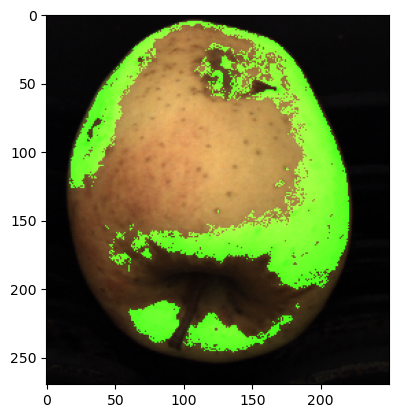

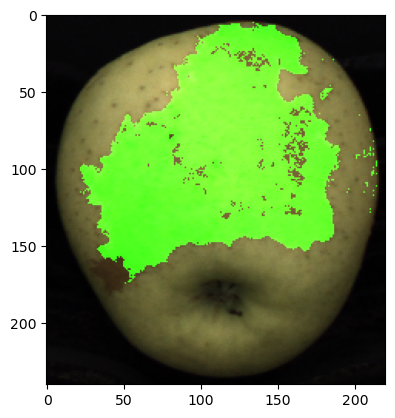

In [80]:
SIGMA = 5
K = math.ceil(3*SIGMA)

#filt = [cv2.GaussianBlur(img, (2*K+1, 2*K+1), SIGMA) for img in masked_filtered_imgs]
filt = masked_filtered_imgs

dis_1_s_1_1 = get_mahalanobis_distance_img(filt[0], samples_2, colour_space_fun)
#dis_1_s_1_2 = get_mahalanobis_distance_img(masked_filtered_imgs[0], samples_1_2, colour_space_fun)
dis_2_s_1_1 = get_mahalanobis_distance_img(filt[1], samples_2, colour_space_fun)


plot_tresholded_image(colour_imgs[0], dis_1_s_1_1, 6)
plot_tresholded_image(colour_imgs[1], dis_2_s_1_1, 7)

In [81]:
 # IDEA

In [82]:
'''MANUAL_TRESHOLD = 180

masks = []

# Set
SIGMA = 2
K = math.ceil(3*SIGMA)

s = process_time()

for img in colour_space_dict['LUV']:
    #blur = cv2.medianBlur(img, 3)
    #blur = cv2.GaussianBlur(blur, (2*K+1, 2*K+1), SIGMA)
    treshold, mask = cv2.threshold(img[:,:,2], MANUAL_TRESHOLD, 255, cv2.THRESH_BINARY)
    masks.append(mask)

print(process_time() - s)

plot_image_grid(masks, f'Binary masks obtained through Intensity Binarization (Treshold = {MANUAL_TRESHOLD})')

masks = [apply_flood_fill(i) for i in masks]

plot_image_grid(masks, f'Binary masks obtained through Intensity Binarization and flood-fill (Treshold = {MANUAL_TRESHOLD})')

bounded_images = []

for idx, img in enumerate(colour_imgs):
    green_mask = cv2.cvtColor(masks[idx], cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    bounded_images.append(cv2.addWeighted(green_mask, 0.3, img, 1, 0))
    
plot_image_grid(bounded_images, 'Outline of the fruits obtained through Intensity Binarization')''';

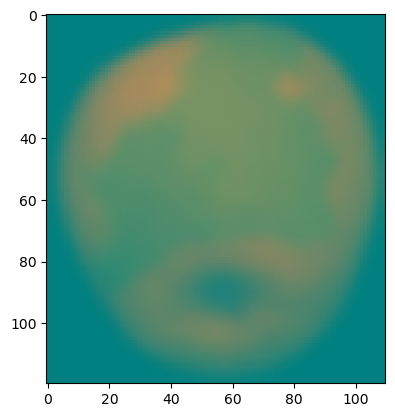

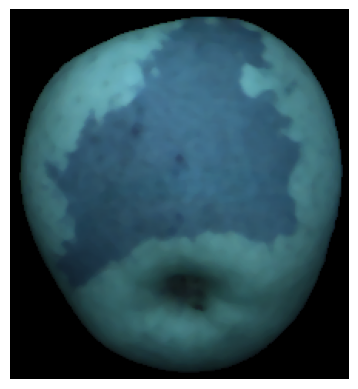

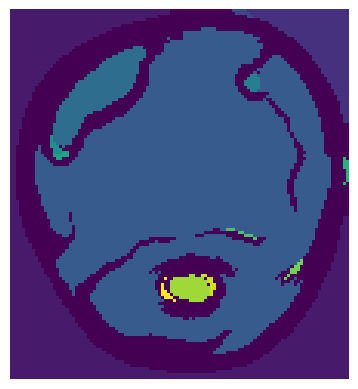

In [83]:
img = masked_filtered_imgs[1]
lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

n = 0

SIGMA = 2
K = math.ceil(3*SIGMA)

while(n < 1):
    lab_img = cv2.pyrDown(lab_img)
    n +=  1

lab_img = cv2.GaussianBlur(lab_img, (2*K+1, 2*K+1), SIGMA)

lab_img = cv2.medianBlur(lab_img, 5)

plt.imshow(lab_img)
plt.show()

feature_image=np.reshape(lab_img, [-1, 3])
rows, cols, chs = lab_img.shape

dim = 6
min_samples = 2*dim

db = DBSCAN(eps=dim, min_samples=min_samples, metric='manhattan',algorithm='auto')
db.fit(feature_image)
labels = db.labels_

indices = np.dstack(np.indices(lab_img.shape[:2]))
xycolors = np.concatenate((lab_img, indices), axis=-1) 
feature_image2 = np.reshape(xycolors, [-1,5])
db.fit(feature_image2)
labels2 = db.labels_

plt.imshow(img)
plt.axis('off')
plt.show()

# plt.subplot(2, 1, 2)
# plt.imshow(np.reshape(labels, [rows, cols]))
# plt.axis('off')
plt.imshow(np.reshape(labels2, [rows, cols]))
plt.axis('off')
plt.show()

In [84]:
'''def down_sample(img, n):
    for i in range(n):
        img = cv2.pyrDown(img)
    return img'''

'def down_sample(img, n):\n    for i in range(n):\n        img = cv2.pyrDown(img)\n    return img'

In [86]:
'''img = colour_space_dict['YUV'][0][:,:,1]

# perform a naive attempt to find the (x, y) coordinates of
# the area of the image with the largest intensity value
(minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(img)

cv2.circle(img, maxLoc, 5, (255, 0, 0), 2)
# display the results of the naive attempt

plt.imshow(img)
# apply a Gaussian blur to the image then find the brightest
# region
gray = cv2.GaussianBlur(img, (5, 5), 0)
(minVal, maxVal, minLoc, maxLoc) = cv2.minMaxLoc(gray)
image = orig.copy()
cv2.circle(img, maxLoc, 5, (255, 0, 0), 2)
# display the results of our newly improved method
plt.imshow(img)''';

In [87]:
#

### Last attempt

In [88]:
'''sigma = 2
k = math.ceil(3*sigma)

x = 0
y = 150

# Get the last YCrCb channel and gaussian blur it
blur_masked_filtered_imgs = [cv2.GaussianBlur(img[:,:,2], (2*k+1, 2*k+1), sigma) for img in colour_space_dict['BGR']]

edges_imgs = [cv2.Canny(img, x, y) for img in blur_masked_filtered_imgs]

#plot_image_grid(masked_filtered_imgs, 'Original Masked Images', edges_imgs)

imgs_with_edge = []

for idx, img in enumerate(colour_imgs):
    red_edge_mask = cv2.cvtColor(edges_imgs[idx], cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    red_edge_mask[:,:,:-1] = 0
    
    element = cv2.getStructuringElement(0, (3, 3))
    imgs_with_edge.append(cv2.addWeighted(cv2.dilate(red_edge_mask, element), 1,  img, 1, 0))

plot_image_grid(masked_filtered_imgs, 'Original Masked Images', nir_names)
plot_image_grid(edges_imgs, 'Edge detection applied on Images', nir_names)
plot_image_grid(imgs_with_edge, 'Edge detection applied on Images', nir_names)''';

In [89]:
def exponential_operator(img, r):
    exp_img = ((img/255)**r) *255
    return exp_img

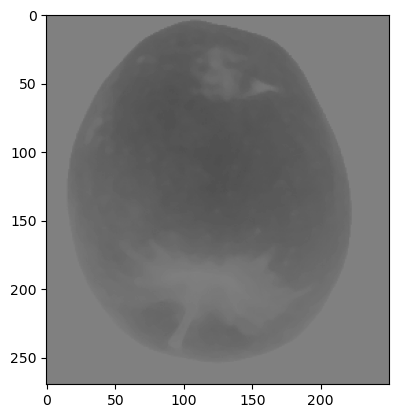

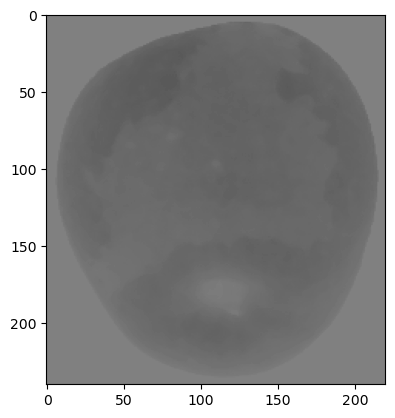

In [90]:
res1, res2 = colour_space_dict['YCrCb']

res1 = res1[:,:,-1]
res2 = res2[:,:,-1]

plt.imshow(res1, cmap='gray', vmin=0, vmax=255)
plt.show()
plt.imshow(res2, cmap='gray', vmin=0, vmax=255)
plt.show()

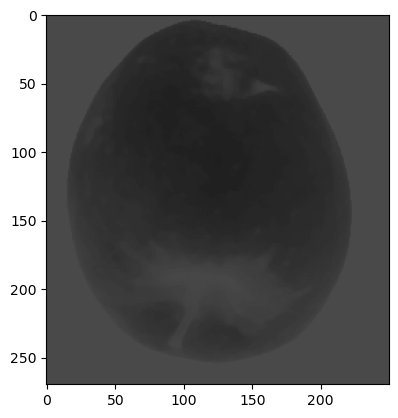

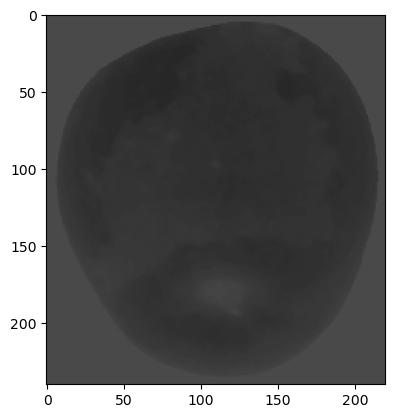

In [91]:
res1_prepr = exponential_operator(res1, 1.8)
res2_prepr = exponential_operator(res2, 1.8)

res1_prepr = res1_prepr.astype(np.uint8)
res2_prepr = res2_prepr.astype(np.uint8)

plt.imshow(res1_prepr, cmap='gray', vmin=0, vmax=255)
plt.show()
plt.imshow(res2_prepr, cmap='gray', vmin=0, vmax=255)
plt.show()

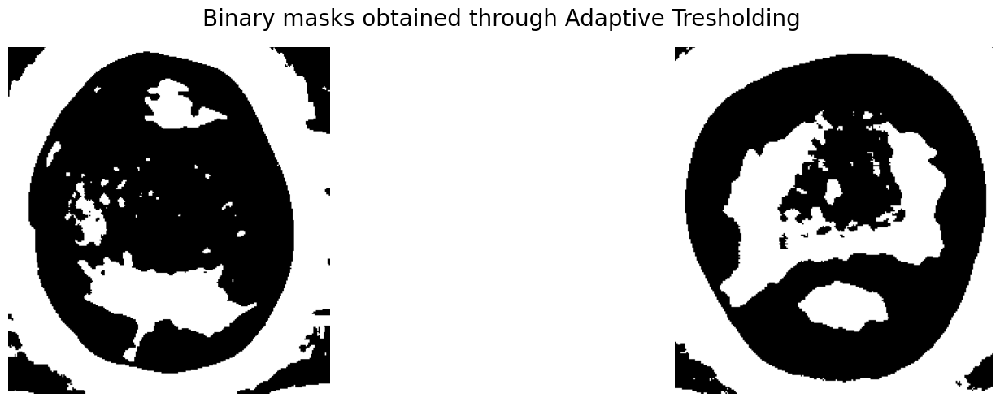

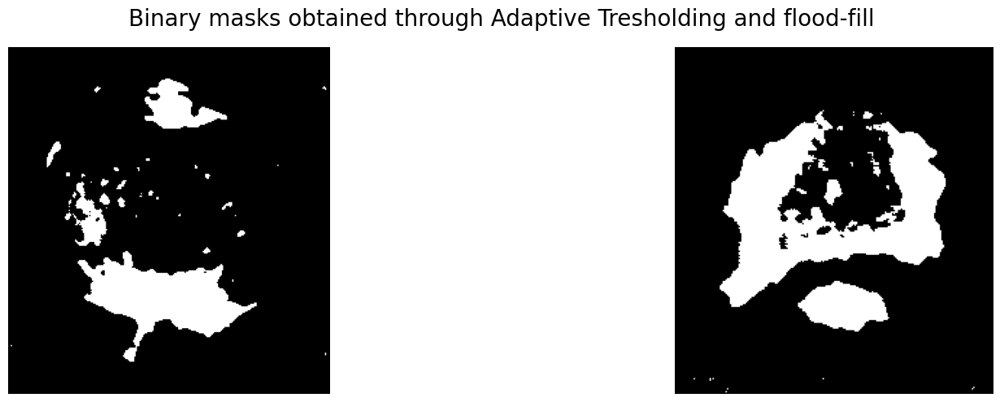

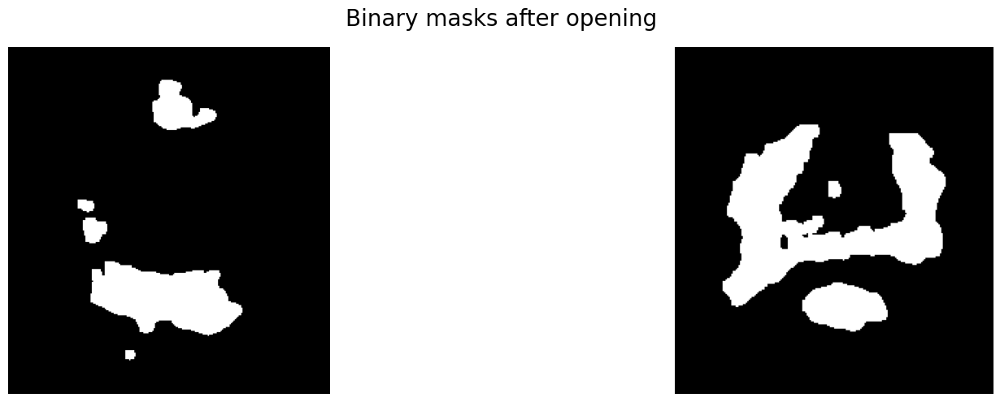

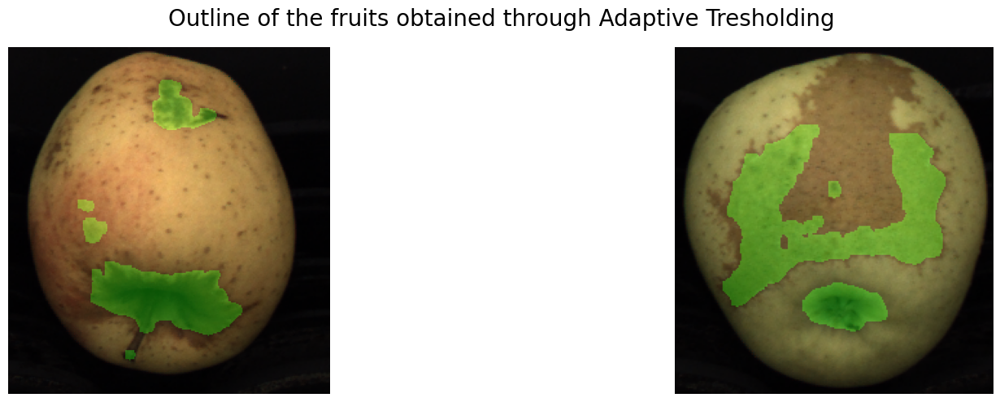

In [92]:
# obtaining the mask and preprocessing imgs

# median blur on images
filtered_G_images = [cv2.medianBlur(img[:,:,1],5) for img in colour_imgs]

# greyscale image masking 

masks = []

#s = process_time()
for img in filtered_G_images:
    mask = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 75, 2)
    masks.append(mask)

plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding')
    
# Pad masks and flood-fill the background
masks = [np.pad(m, 1, mode='constant', constant_values=255) for m in masks]
for m in masks:
    cv2.floodFill(m, None, (0,0), 0)
    #cv2.floodFill(m, None, (0,0), 255)
# Downsample the masks to their original size
masks = [m[1:-1,1:-1] for m in masks]
#print(process_time() - s)

# plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding')

#masks = [255 - i for i in masks]

plot_image_grid(masks, 'Binary masks obtained through Adaptive Tresholding and flood-fill')

element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (8, 8))
#roi_1_2_mask = cv2.morphologyEx(roi_1_2_mask, cv2.MORPH_OPEN, element)
masks = [cv2.morphologyEx(m, cv2.MORPH_OPEN, element) for m in masks]


plot_image_grid(masks, 'Binary masks after opening')


#opening_edges = [cv2.morphologyEx(img, cv2.MORPH_CLOSE, element) for img in eroded_edge_masks]
#plot_image_grid(closing_edges, 'Closing Operation Masks', nir_names)

bounded_images = []

for idx, img in enumerate(colour_imgs):
    green_mask = cv2.cvtColor(masks[idx], cv2.COLOR_GRAY2BGR)
    # Force the bits of every channel except the green at 0
    green_mask[:,:,::2] = 0
    bounded_images.append(cv2.addWeighted(green_mask, 0.3, img, 1, 0))
    
plot_image_grid(bounded_images, 'Outline of the fruits obtained through Adaptive Tresholding')

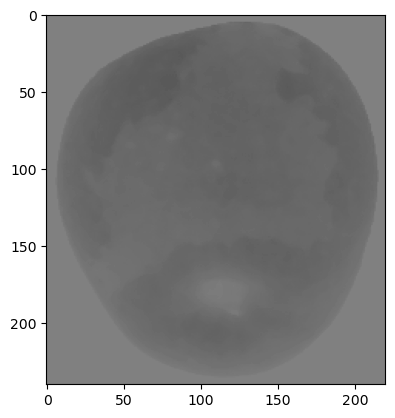

In [93]:
img = np.copy(colour_space_dict['YCrCb'][1][:,:,2])
plt.imshow(img, cmap='gray', vmin=0, vmax=255)


[]

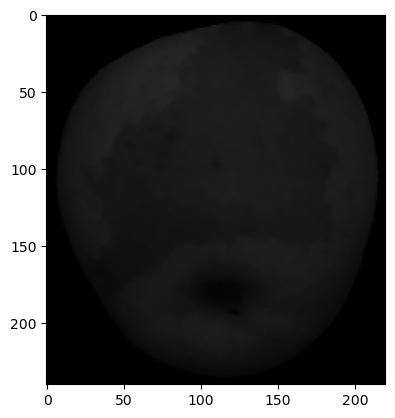

In [94]:
# Getting the kernel to be used in Top-Hat
filterSize =(251,251)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, filterSize)
  
# Reading the image named 'input.jpg'

# Applying the Top-Hat operation
tophat_img = cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)
  
plt.imshow(tophat_img,  cmap='gray', vmin=0, vmax=255)
plt.plot()